In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
# To display all the columns of dataframe
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use("default")

import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Technocolabs/Bondora_preprocessed.csv")

In [ ]:
df.head()

,BidsPortfolioManager,BidsApi,BidsManual,NewCreditCustomer,VerificationType,LanguageCode,Age,Gender,Country,AppliedAmount,Amount,Interest,LoanDuration,MonthlyPayment,County,City,UseOfLoan,Education,MaritalStatus,EmploymentStatus,EmploymentDurationCurrentEmployer,OccupationArea,HomeOwnershipType,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,Rating,Restructured,CreditScoreEsMicroL,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
0,0,0,115.0410,True,Unverified/Cross Referenced Phone,Estonian,61,Woman,Estonia,319.5582,115.0408,30.0,12,NaN,HARJU,TALLINN,Other,Vocational Education,Married,Fully Employed,UpTo3Years,Retail and Wholesale,NaN,10500.0,0,0.0,0,0.0,0.0,25,NaN,False,NaN,115.0408,20.4222,0.00,0.00,1,83.0852,0.0000,0,0
1,0,0,140.6057,False,Unverified/Cross Referenced Phone,Estonian,48,Woman,Estonia,191.7349,140.6057,25.0,1,NaN,IDA-VIRU,KOHTLA-JARVE,Other,Higher Education,Divorced,Fully Employed,MoreThan5Years,Education,NaN,10800.0,0,0.0,0,0.0,0.0,15,NaN,False,NaN,140.6057,2.0227,0.00,0.00,2,255.6467,258.6256,0,0
2,0,0,319.5580,True,Unverified/Cross Referenced Phone,Estonian,58,Woman,Estonia,319.5582,319.5409,25.0,20,NaN,PÄRNU,PÄRNU,Home Improvement,Secondary Education,Married,Fully Employed,UpTo4Years,Mining,NaN,7000.0,0,0.0,0,0.0,0.0,25,NaN,True,NaN,203.1909,59.7626,116.35,414.07,0,0.0000,0.0000,0,1
3,0,0,57.5205,True,Unverified/Cross Referenced Phone,Estonian,23,Woman,Estonia,127.8233,57.5205,45.0,15,NaN,HARJU,PALDISKI,Loan Consolidation,Basic Education,Single,NaN,UpTo2Years,Other,NaN,11600.0,0,0.0,0,0.0,0.0,15,NaN,False,NaN,57.5205,18.7323,0.00,0.00,1,134.2144,0.0000,0,0
4,0,0,319.5582,True,Unverified/Cross Referenced Phone,Estonian,25,Woman,Estonia,319.5582,319.5436,30.0,12,NaN,TARTU,TARTU,Vehicle,Secondary Education,Cohabitant,Fully Employed,UpTo2Years,Retail and Wholesale,NaN,6800.0,0,0.0,0,0.0,0.0,25,NaN,False,NaN,319.5436,220.4200,0.00,0.00,1,146.9966,0.0000,0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 42 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   BidsPortfolioManager                    77394 non-null  int64  
 1   BidsApi                                 77394 non-null  int64  
 2   BidsManual                              77394 non-null  float64
 3   NewCreditCustomer                       77394 non-null  bool   
 4   VerificationType                        77341 non-null  object 
 5   LanguageCode                            77383 non-null  object 
 6   Age                                     77394 non-null  int64  
 7   Gender                                  77349 non-null  object 
 8   Country                                 77394 non-null  object 
 9   AppliedAmount                           77394 non-null  float64
 10  Amount                                  77394 non-null  fl

# **Data Cleaning**

**Re-Converting Categorical Variables**

In [ ]:
cat_cols=['VerificationType','LanguageCode','Gender','Country','UseOfLoan','Education','MaritalStatus','EmploymentStatus',
          'EmploymentDurationCurrentEmployer','OccupationArea','HomeOwnershipType','Rating','CreditScoreEsMicroL','LoanDuration']

for col in cat_cols:
  df[col] = df[col].astype("category")

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 42 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   BidsPortfolioManager                    77394 non-null  int64   
 1   BidsApi                                 77394 non-null  int64   
 2   BidsManual                              77394 non-null  float64 
 3   NewCreditCustomer                       77394 non-null  bool    
 4   VerificationType                        77341 non-null  category
 5   LanguageCode                            77383 non-null  category
 6   Age                                     77394 non-null  int64   
 7   Gender                                  77349 non-null  category
 8   Country                                 77394 non-null  category
 9   AppliedAmount                           77394 non-null  float64 
 10  Amount                                  77394 

In [ ]:
# knowing which columns have null values
nullCols= df.isnull().sum() > 0 
nullCols = nullCols[nullCols].index
nullCols

Index(['VerificationType', 'LanguageCode', 'Gender', 'MonthlyPayment',
       'County', 'City', 'UseOfLoan', 'Education', 'MaritalStatus',
       'EmploymentStatus', 'EmploymentDurationCurrentEmployer',
       'OccupationArea', 'HomeOwnershipType', 'DebtToIncome', 'FreeCash',
       'Rating', 'CreditScoreEsMicroL', 'PreviousRepaymentsBeforeLoan'],
      dtype='object')

In [ ]:
# knowing null columns types
df[nullCols].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 18 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   VerificationType                   77341 non-null  category
 1   LanguageCode                       77383 non-null  category
 2   Gender                             77349 non-null  category
 3   MonthlyPayment                     70767 non-null  float64 
 4   County                             56879 non-null  object  
 5   City                               72350 non-null  object  
 6   UseOfLoan                          77341 non-null  category
 7   Education                          77341 non-null  category
 8   MaritalStatus                      77341 non-null  category
 9   EmploymentStatus                   77165 non-null  category
 10  EmploymentDurationCurrentEmployer  76520 non-null  category
 11  OccupationArea                     77297 

In [ ]:
dtypes = pd.DataFrame(df.dtypes,columns=["Data Type"])

dtypes["Unique Values"]=df.nunique()

dtypes["Null Values"]=df.isnull().sum()

dtypes["% null Values"]=df.isnull().sum()/len(df)

dtypes.sort_values(by="Null Values" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Data Type,Unique Values,Null Values,% null Values
CreditScoreEsMicroL,category,11,26186,0.338347
County,object,960,20515,0.265072
PreviousRepaymentsBeforeLoan,float64,26750,19316,0.249580
MonthlyPayment,float64,21334,6627,0.085627
City,object,6625,5044,0.065173
Rating,category,8,2728,0.035248
HomeOwnershipType,category,11,1698,0.021940
EmploymentDurationCurrentEmployer,category,9,874,0.011293
EmploymentStatus,category,6,229,0.002959
OccupationArea,category,19,97,0.001253


**Filling Null Values**

Visualizing the missing values

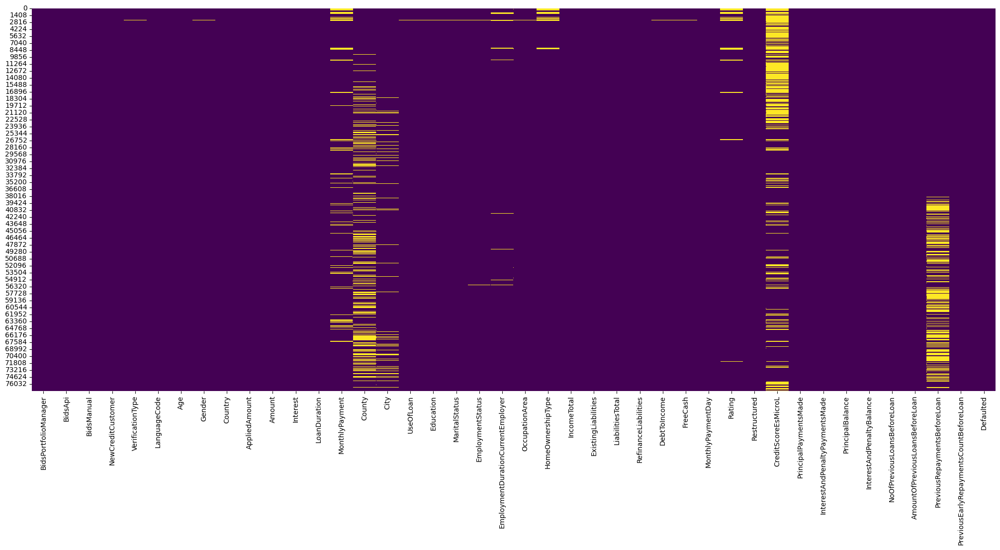

In [ ]:
plt.figure(figsize=(25,10))

sns.heatmap(df.isnull(), cbar=False,cmap='viridis')

Categorical and String Columns

In [ ]:
# Filling Null Categorical and String Values With Mode
NullCatStr_Data = df[nullCols].select_dtypes(include="category")

CatStr_Mode = NullCatStr_Data.mode().iloc[0]

NullCatStr_Data = NullCatStr_Data.fillna(CatStr_Mode)

NullCatStr_Data.isnull().sum()

VerificationType                     0
LanguageCode                         0
Gender                               0
UseOfLoan                            0
Education                            0
MaritalStatus                        0
EmploymentStatus                     0
EmploymentDurationCurrentEmployer    0
OccupationArea                       0
HomeOwnershipType                    0
Rating                               0
CreditScoreEsMicroL                  0
dtype: int64

In [ ]:
df[NullCatStr_Data.columns] = NullCatStr_Data
df[NullCatStr_Data.columns].isnull().sum()

VerificationType                     0
LanguageCode                         0
Gender                               0
UseOfLoan                            0
Education                            0
MaritalStatus                        0
EmploymentStatus                     0
EmploymentDurationCurrentEmployer    0
OccupationArea                       0
HomeOwnershipType                    0
Rating                               0
CreditScoreEsMicroL                  0
dtype: int64

Numerical Columns

In [ ]:
# Filling Null Numerical Values With Mode
NullNumeric_Data = df[nullCols].select_dtypes(exclude="category")

Numeric_Mean = NullNumeric_Data.mean()

NullNumeric_Data = NullNumeric_Data.fillna(Numeric_Mean)

NullNumeric_Data.isnull().sum()

MonthlyPayment                      0
County                          20515
City                             5044
DebtToIncome                        0
FreeCash                            0
PreviousRepaymentsBeforeLoan        0
dtype: int64

In [ ]:
df[NullNumeric_Data.columns] = NullNumeric_Data
df[NullNumeric_Data.columns].isnull().sum()

MonthlyPayment                      0
County                          20515
City                             5044
DebtToIncome                        0
FreeCash                            0
PreviousRepaymentsBeforeLoan        0
dtype: int64



---



In [ ]:
# dropping unwanted columns
df.drop(columns= ["City","County"], inplace=True)

In [ ]:
dtypes = pd.DataFrame(df.dtypes,columns=["Data Type"])

dtypes["Unique Values"]=df.nunique().sort_values(ascending=True)

dtypes["Null Values"]=df.isnull().sum()

dtypes["% null Values"]=df.isnull().sum()/len(df)

dtypes.sort_values(by="Unique Values" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Data Type,Unique Values,Null Values,% null Values
InterestAndPenaltyPaymentsMade,float64,48469,0,0.000000
InterestAndPenaltyBalance,float64,39708,0,0.000000
PrincipalBalance,float64,33980,0,0.000000
PrincipalPaymentsMade,float64,31990,0,0.000000
LiabilitiesTotal,float64,28843,0,0.000000
PreviousRepaymentsBeforeLoan,float64,26751,0,0.000000
FreeCash,float64,21493,0,0.000000
MonthlyPayment,float64,21335,0,0.000000
AmountOfPreviousLoansBeforeLoan,float64,7827,0,0.000000
DebtToIncome,float64,6723,0,0.000000


In [ ]:
df.to_csv('/content/drive/MyDrive/Technocolabs/Bondora_preprocessed.csv',index=False)

# **Now let's check the distibution of our features**

In [ ]:
df.describe()

,BidsPortfolioManager,BidsApi,BidsManual,Age,AppliedAmount,Amount,Interest,MonthlyPayment,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,RefinanceLiabilities,DebtToIncome,FreeCash,MonthlyPaymentDay,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,NoOfPreviousLoansBeforeLoan,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
count,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.00000,77394.000000,7.739400e+04,77394.000000,7.739400e+04,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000,77394.000000
mean,1221.504303,32.766506,563.032056,39.611611,2746.981169,2472.673771,40.30165,130.393314,1.868975e+03,3.350815,7.149255e+02,0.300127,12.011918,195.241403,11.356539,1077.613937,502.770026,1372.262893,1215.017495,1.140799,2172.676382,861.138387,0.077474,0.591415
std,1531.208800,163.557245,821.757218,12.188868,2463.487043,2163.710046,30.61795,125.725231,6.193487e+03,3.494328,4.459142e+04,1.123265,18.824047,848.437821,7.336154,1648.865768,829.168708,1944.295361,3220.010093,2.028045,3889.556046,1799.053621,0.384662,0.491575
min,0.000000,0.000000,0.000000,0.000000,31.955800,6.390000,3.00000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,-2332.000000,0.000000,0.000000,0.000000,-34.200000,-2.660000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,246.000000,0.000000,19.000000,30.000000,740.000000,740.000000,23.42000,43.070000,8.900000e+02,1.000000,1.130400e+02,0.000000,0.000000,0.000000,5.000000,61.690000,37.450000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,613.000000,0.000000,283.000000,38.000000,2125.000000,2020.000000,31.95500,113.040000,1.300000e+03,2.000000,3.830000e+02,0.000000,0.000000,0.000000,10.000000,462.810000,191.165000,516.865000,84.805000,0.000000,0.000000,366.270000,0.000000,1.000000
75%,1629.000000,5.000000,745.000000,48.000000,3720.000000,3185.000000,50.33000,162.107500,2.000000e+03,5.000000,7.360000e+02,0.000000,20.790000,269.007500,16.000000,1451.292500,612.415000,2111.980000,1083.985000,1.000000,3000.000000,861.138387,0.000000,1.000000
max,10625.000000,7570.000000,10630.000000,77.000000,10632.000000,10632.000000,264.31000,2368.540000,1.012019e+06,36.000000,1.240000e+07,23.000000,198.020000,158748.640000,28.000000,10632.000000,14507.240000,10632.000000,64494.770000,24.000000,51104.000000,34077.420000,11.000000,1.000000


Seperating Plots based on unique values count

In [ ]:
low_unique = (df.nunique() < 30) # columns with less than 30 unique values 
high_unique = ~low_unique        # columns with more than 30 unique values

low_unique = low_unique[low_unique==True].index 
high_unique= high_unique[high_unique==True].index

low_unique , high_unique

(Index(['NewCreditCustomer', 'VerificationType', 'LanguageCode', 'Gender',
        'Country', 'UseOfLoan', 'Education', 'MaritalStatus',
        'EmploymentStatus', 'EmploymentDurationCurrentEmployer',
        'OccupationArea', 'HomeOwnershipType', 'RefinanceLiabilities',
        'MonthlyPaymentDay', 'Rating', 'Restructured', 'CreditScoreEsMicroL',
        'NoOfPreviousLoansBeforeLoan', 'PreviousEarlyRepaymentsCountBeforeLoan',
        'Defaulted'],
       dtype='object'),
 Index(['BidsPortfolioManager', 'BidsApi', 'BidsManual', 'Age', 'AppliedAmount',
        'Amount', 'Interest', 'LoanDuration', 'MonthlyPayment', 'IncomeTotal',
        'ExistingLiabilities', 'LiabilitiesTotal', 'DebtToIncome', 'FreeCash',
        'PrincipalPaymentsMade', 'InterestAndPenaltyPaymentsMade',
        'PrincipalBalance', 'InterestAndPenaltyBalance',
        'AmountOfPreviousLoansBeforeLoan', 'PreviousRepaymentsBeforeLoan'],
       dtype='object'))

**Univariate Analysis**

First the columns with less than 30 unique values

In [ ]:
df[low_unique].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 20 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   NewCreditCustomer                       77394 non-null  bool    
 1   VerificationType                        77394 non-null  category
 2   LanguageCode                            77394 non-null  category
 3   Gender                                  77394 non-null  category
 4   Country                                 77394 non-null  category
 5   UseOfLoan                               77394 non-null  category
 6   Education                               77394 non-null  category
 7   MaritalStatus                           77394 non-null  category
 8   EmploymentStatus                        77394 non-null  category
 9   EmploymentDurationCurrentEmployer       77394 non-null  category
 10  OccupationArea                          77394 

Visualizing columns with less than 30 unique values

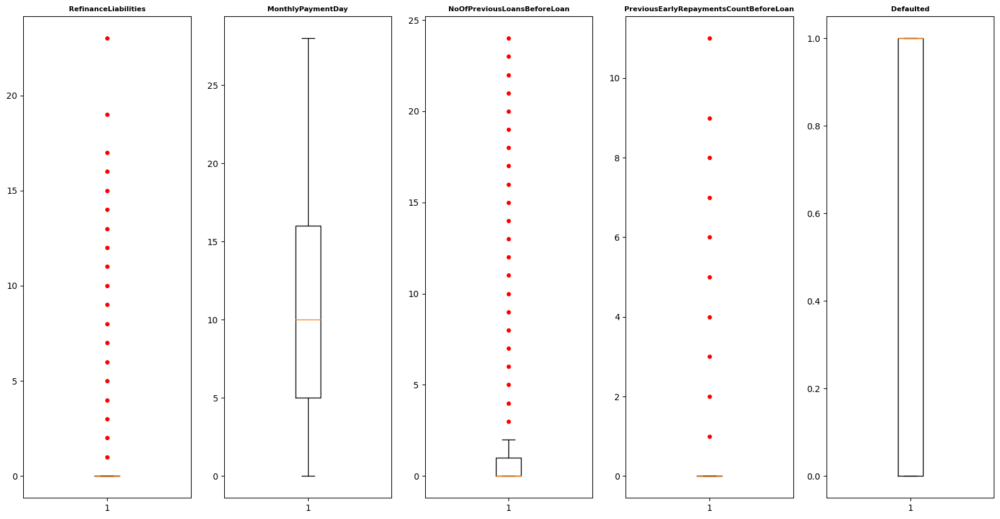

In [ ]:
# first numeric variables
low_unique_num = [ col for col in df[low_unique] if df[low_unique][col].dtype in ["int64"] ]

# Creating subplot of each column with its own scale
red_circle = dict(markerfacecolor='red', marker='o', markeredgecolor='white')

fig, axs = plt.subplots(1, len(df[low_unique_num].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    ax.boxplot(df[low_unique_num].iloc[:,i], flierprops=red_circle)
    ax.set_title(df[low_unique_num].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='y', labelsize=10)

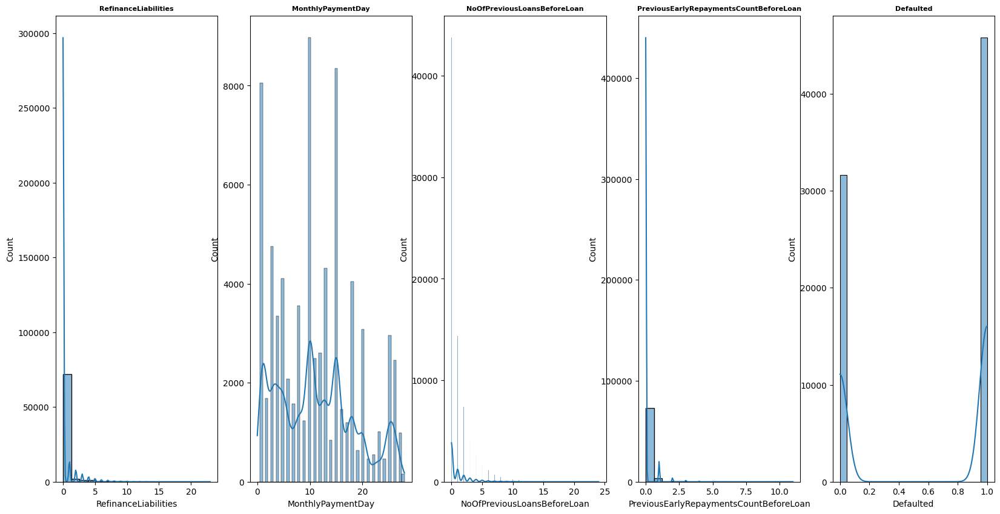

In [ ]:
# let's look at the skewness
fig, axs = plt.subplots(1, len(df[low_unique_num].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.histplot(df[low_unique_num].iloc[:,i] , ax=ax , kde=True)
    ax.set_title(df[low_unique_num].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='y', labelsize=10)

In [ ]:
low_unique_num_analysis = pd.DataFrame([df[low_unique_num].skew(),df[low_unique_num].kurt()] , index=["Skewness","Kurtosis"])
low_unique_num_analysis

,RefinanceLiabilities,MonthlyPaymentDay,NoOfPreviousLoansBeforeLoan,PreviousEarlyRepaymentsCountBeforeLoan,Defaulted
Skewness,5.517715,0.375261,3.181328,8.401324,-0.371938
Kurtosis,40.379077,-0.740222,15.242131,112.650134,-1.861710


> Looks like `RefinanceLiabilities, NoOfPreviousLoansBeforeLoan, PreviousEarlyRepaymentsCountBeforeLoan` Columns are highly postively right skewed

> And `RefinanceLiabilities, NoOfPreviousLoansBeforeLoan, PreviousEarlyRepaymentsCountBeforeLoan` Columns Suffer from **Outliers**

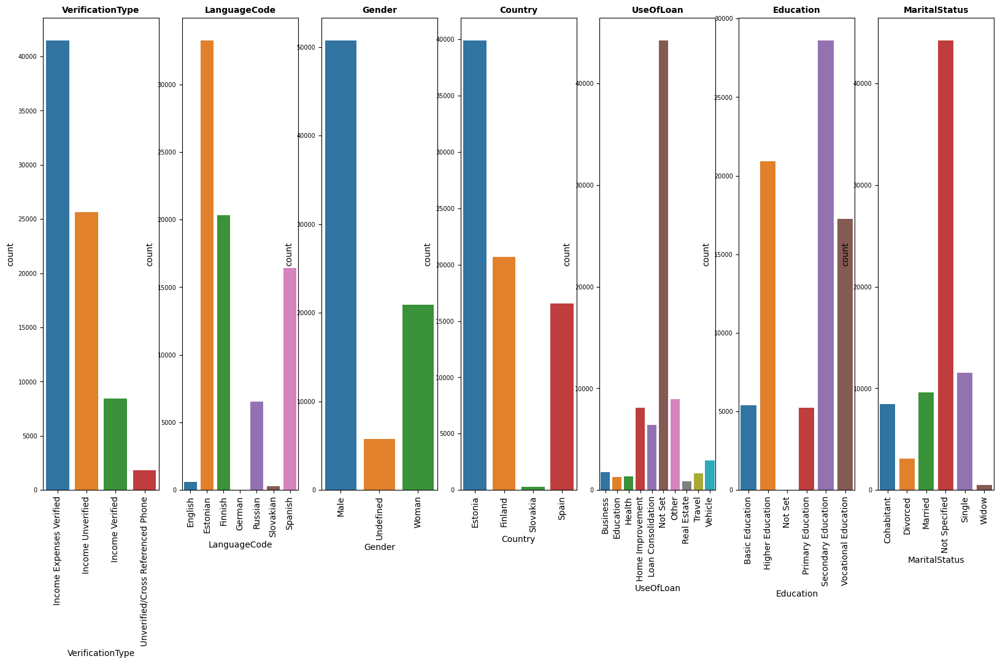

In [ ]:
# second categorical variables
low_unique_cat = [ col for col in df[low_unique] if df[low_unique][col].dtype in ["category"] ]
low_unique_cat1 = low_unique_cat[:7] # seperate it to better visualization

#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_cat1].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.countplot(df[low_unique_cat1].iloc[:,i] , ax=ax)
    ax.set_title(df[low_unique_cat1].columns[i], fontsize=10, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=10 , rotation=90)   
#plt.tight_layout()    

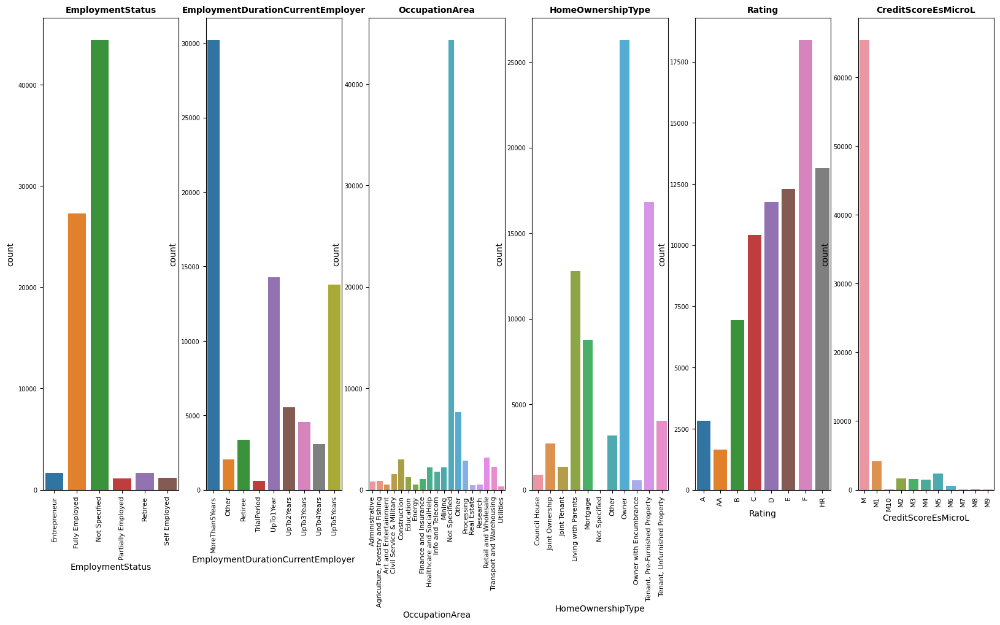

In [ ]:
# remaining categorical variables
low_unique_cat2 = low_unique_cat[7:]

#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_cat2].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.countplot(df[low_unique_cat2].iloc[:,i] , ax=ax)
    ax.set_title(df[low_unique_cat2].columns[i], fontsize=10, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=8 , rotation=90)   


Looks like there is many categorical variables with a lot of Not Set/Not Specified Categories
> `UseOfLoan, MaritalStatus, EmploymentStatus, Occupation Area`

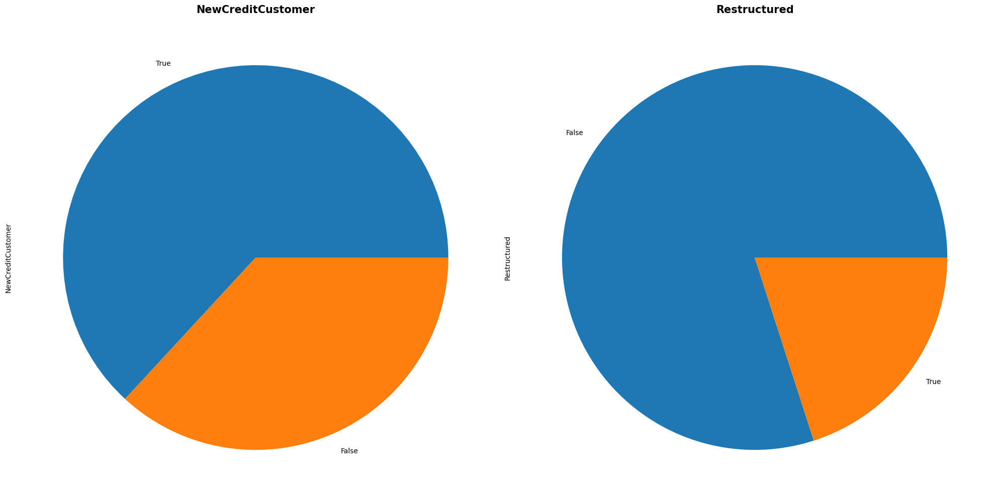

In [ ]:
# third bool variables
low_unique_bool = [ col for col in df[low_unique] if df[low_unique][col].dtype in ["bool"] ]

#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_bool].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    df[low_unique_bool].iloc[:,i].value_counts().plot(kind="pie" , ax=ax)
    ax.set_title(df[low_unique_bool].columns[i], fontsize=15, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=8 , rotation=90)   
plt.tight_layout()   

>Looks like more than half of the users had a prior credit history in Bondora

>and most of the The original maturity date of the loan haven't been increased by more than 60 days



---



Visualizing columns with less than 30 unique values

In [ ]:
# dropping categories columns
high_unique= high_unique.drop("LoanDuration")

In [ ]:
len(high_unique)

19

In [ ]:
df[high_unique].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 19 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   BidsPortfolioManager             77394 non-null  int64  
 1   BidsApi                          77394 non-null  int64  
 2   BidsManual                       77394 non-null  float64
 3   Age                              77394 non-null  int64  
 4   AppliedAmount                    77394 non-null  float64
 5   Amount                           77394 non-null  float64
 6   Interest                         77394 non-null  float64
 7   MonthlyPayment                   77394 non-null  float64
 8   IncomeTotal                      77394 non-null  float64
 9   ExistingLiabilities              77394 non-null  int64  
 10  LiabilitiesTotal                 77394 non-null  float64
 11  DebtToIncome                     77394 non-null  float64
 12  FreeCash          

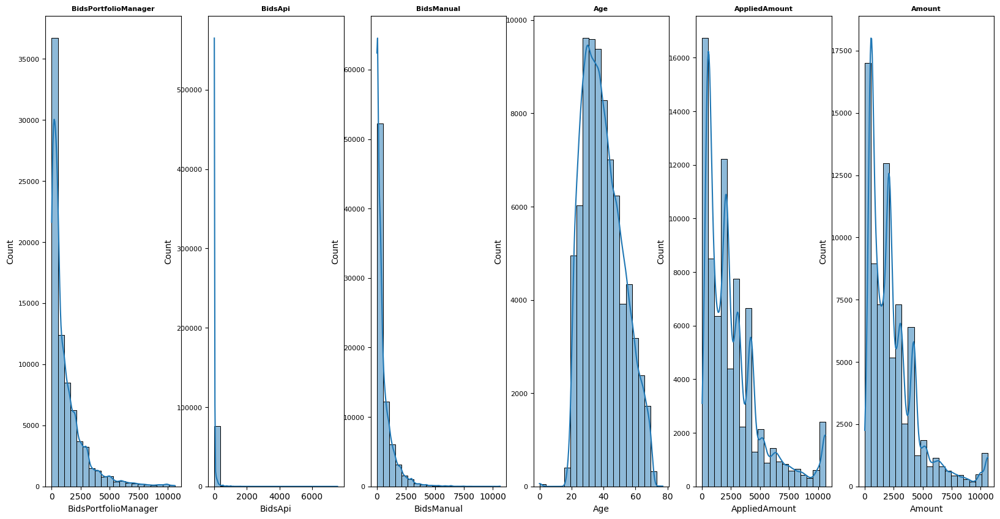

In [ ]:
# seperate it to better visualization
high_unique1 = high_unique[:6]

#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[high_unique1].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.histplot(df[high_unique1].iloc[:,i] , ax=ax , kde=True, bins=20)
    ax.set_title(df[high_unique1].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='y', labelsize=8)

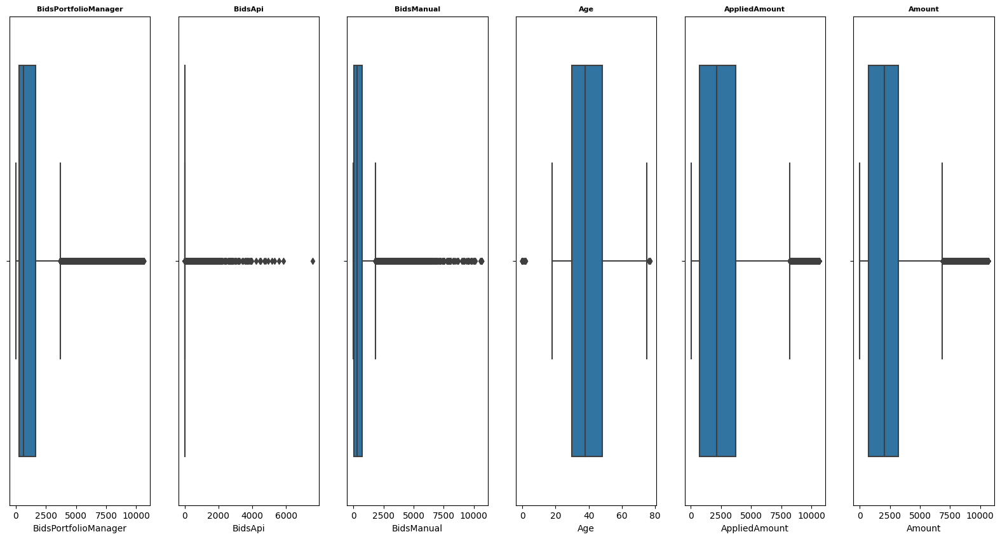

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[high_unique1].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    #ax.boxplot(df[low_unique_num].iloc[:,i], flierprops=red_circle)
    sns.boxplot(df[high_unique1].iloc[:,i] , ax=ax)
    ax.set_title(df[high_unique1].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='y', labelsize=8)

In [ ]:
high_unique1_analysis = pd.DataFrame([df[high_unique1].skew(),df[high_unique1].kurt()] , index=["Skewness","Kurtosis"])
high_unique1_analysis

,BidsPortfolioManager,BidsApi,BidsManual,Age,AppliedAmount,Amount
Skewness,2.501760,14.035464,3.342247,0.445808,1.556302,1.711748
Kurtosis,8.024201,310.775675,18.745962,-0.556669,2.156985,3.262368


> Looks Like All these Columns are highly positvely right skewed Except `Age`

> And `BidsPortfolioManager, BidsApi, BidsManual` Columns Suffer from **Outliers**, Where there is rare cases of **Outliers** in `Age`, `AppliedAmount`  Columns

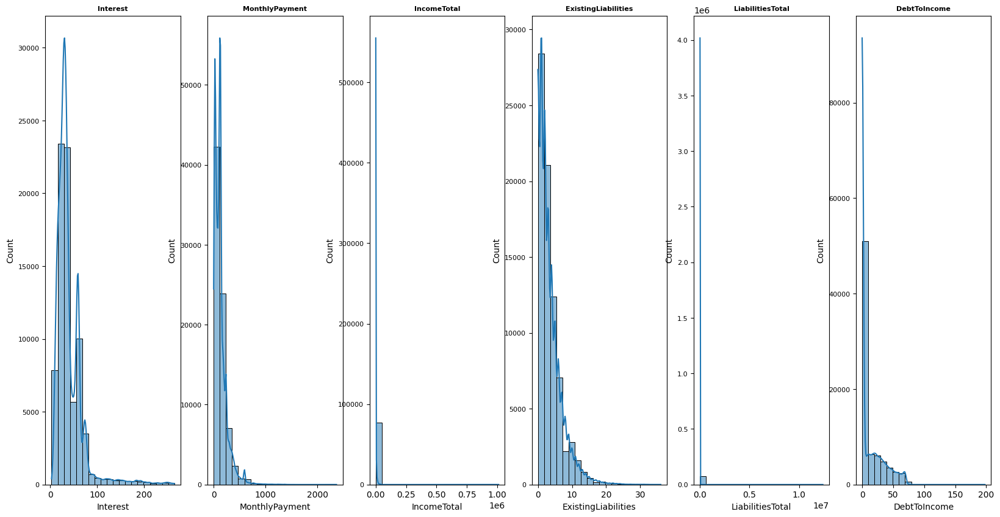

In [ ]:
# remaning from seperation
high_unique2 = high_unique[6:12]

#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[high_unique2].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.histplot(df[high_unique2].iloc[:,i] , ax=ax , kde=True, bins=20)
    ax.set_title(df[high_unique2].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='y', labelsize=8)

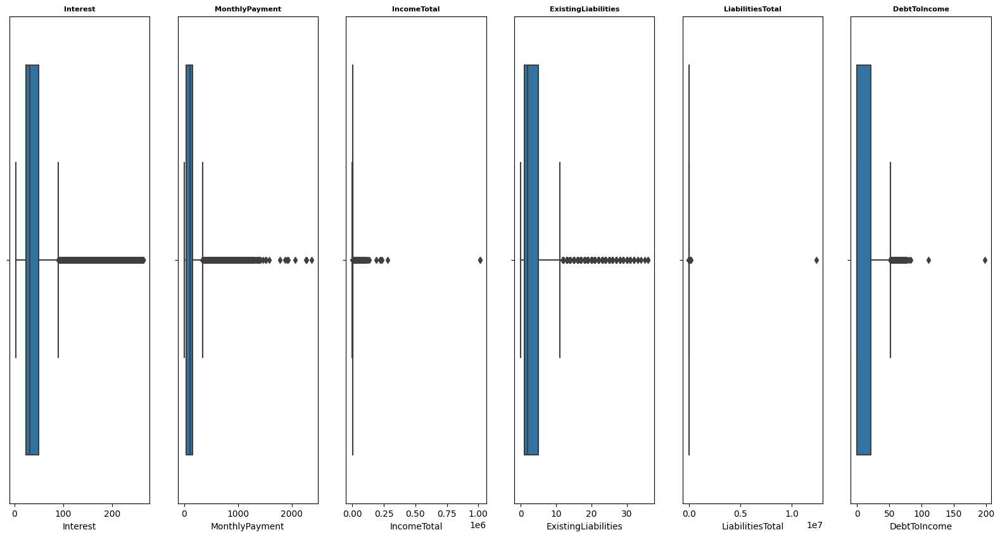

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[high_unique2].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    #ax.boxplot(df[low_unique_num].iloc[:,i], flierprops=red_circle)
    sns.boxplot(df[high_unique2].iloc[:,i] , ax=ax)
    ax.set_title(df[high_unique2].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='y', labelsize=8)

In [ ]:
high_unique2_analysis = pd.DataFrame([df[high_unique2].skew(),df[high_unique2].kurt()] , index=["Skewness","Kurtosis"])
high_unique2_analysis

,Interest,MonthlyPayment,IncomeTotal,ExistingLiabilities,LiabilitiesTotal,DebtToIncome
Skewness,3.312138,2.942541,117.008875,1.985329,277.810800,1.510857
Kurtosis,15.178616,18.029590,18435.086892,6.261875,77249.671018,1.268491


> Looks Like All Columns are highly positvely skewed

> And All Columns Columns Suffer from **Outliers** Except for `Interest` has rare cases

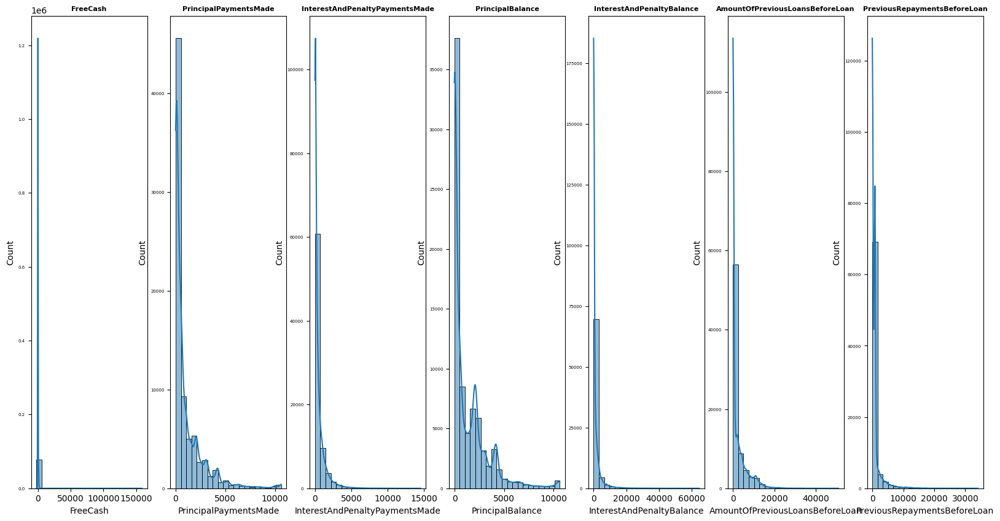

In [ ]:
# remaning from seperation
high_unique3 = high_unique[12:]

#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[high_unique3].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.histplot(df[high_unique3].iloc[:,i] , ax=ax , kde=True, bins=20)
    ax.set_title(df[high_unique3].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='y', labelsize=5)

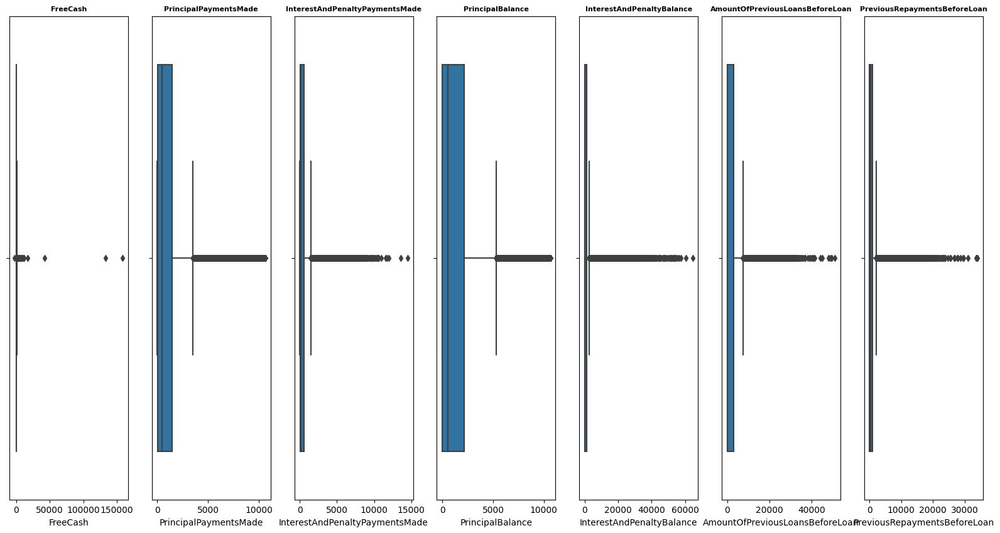

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[high_unique3].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    #ax.boxplot(df[low_unique_num].iloc[:,i], flierprops=red_circle)
    sns.boxplot(df[high_unique3].iloc[:,i] , ax=ax)
    ax.set_title(df[high_unique3].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='y', labelsize=8)

In [ ]:
high_unique3_analysis = pd.DataFrame([df[high_unique3].skew(),df[high_unique3].kurt()] , index=["Skewness","Kurtosis"])
high_unique3_analysis

,FreeCash,PrincipalPaymentsMade,InterestAndPenaltyPaymentsMade,PrincipalBalance,InterestAndPenaltyBalance,AmountOfPreviousLoansBeforeLoan,PreviousRepaymentsBeforeLoan
Skewness,136.088100,2.736685,3.844363,2.110596,6.577773,2.655931,5.356094
Kurtosis,23640.494966,9.411420,23.507477,5.379160,64.082430,9.994425,41.503005


> Looks Like All these Columns are highly positvely skewed

> And All Columns Suffer from **Outliers** 

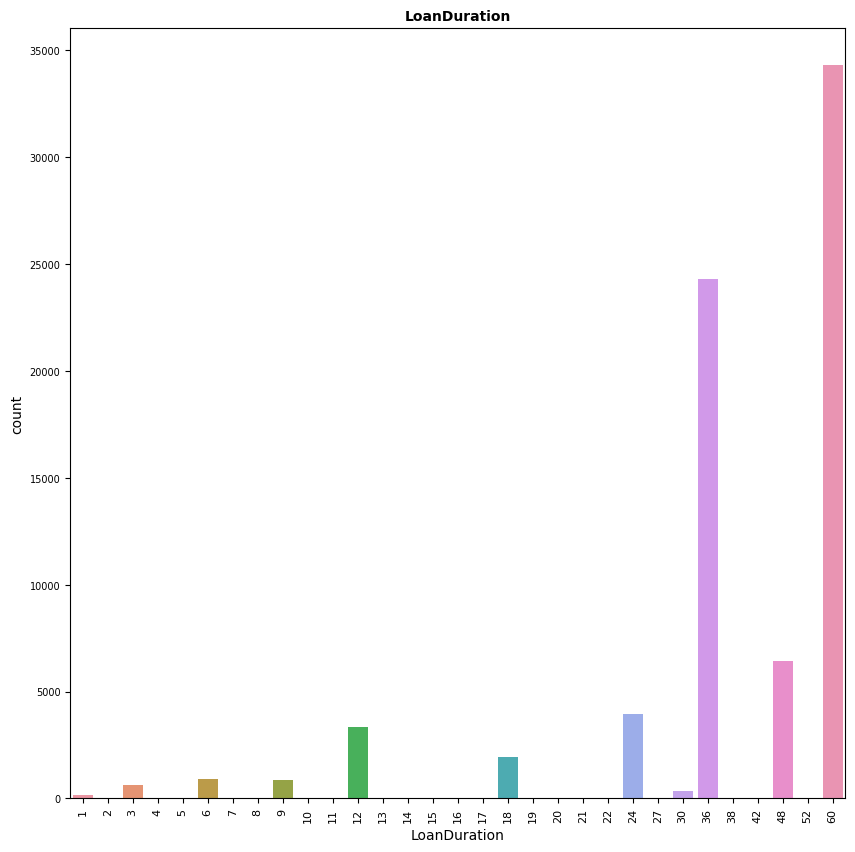

In [ ]:
# remaining categorical variables
fig, axs = plt.subplots( figsize=(10,10))

sns.countplot(df["LoanDuration"] , ax=axs )

axs.set_title("LoanDuration", fontsize=10, fontweight='bold')
axs.tick_params(axis='y', labelsize=7)
axs.tick_params(axis='x', labelsize=8 , rotation=90) 

In [ ]:
df["LoanDuration"].value_counts()

60    34304
36    24313
48     6408
24     3955
12     3350
18     1948
6       926
9       852
3       630
30      334
1       177
2        44
5        34
4        27
10       20
20       16
8        14
15       13
7         9
16        7
22        2
14        2
13        1
21        1
27        1
19        1
17        1
38        1
42        1
52        1
11        1
Name: LoanDuration, dtype: int64

Most of the `LoanDuration` are a multiple of 3 months and others can be considered outliers



---



# **Now let's check the features relation with the target variable**

In [ ]:
df["Defaulted"].value_counts()

1    45772
0    31622
Name: Defaulted, dtype: int64

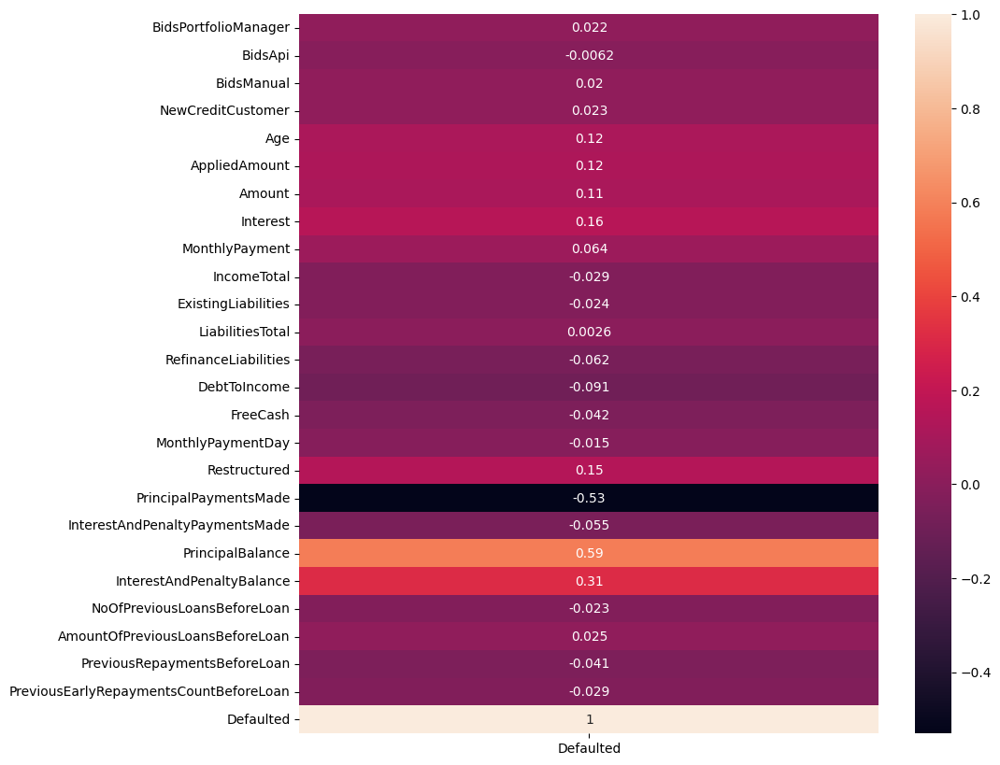

In [ ]:
plt.figure(figsize=(10,10))
sns.heatmap(pd.DataFrame(df.corr()["Defaulted"]), annot=True)

> Looks like our Target Variable have a strong linear relationship with `PrincipalBalance` which is highly postive correlation , and highly negative correlation with `PrincipalPaymentsMade`, Also we can say low positive correlation `InterestAndPenaltyBalance`                   

Let's Verify these assumptions

<Figure size 2500x1000 with 0 Axes>

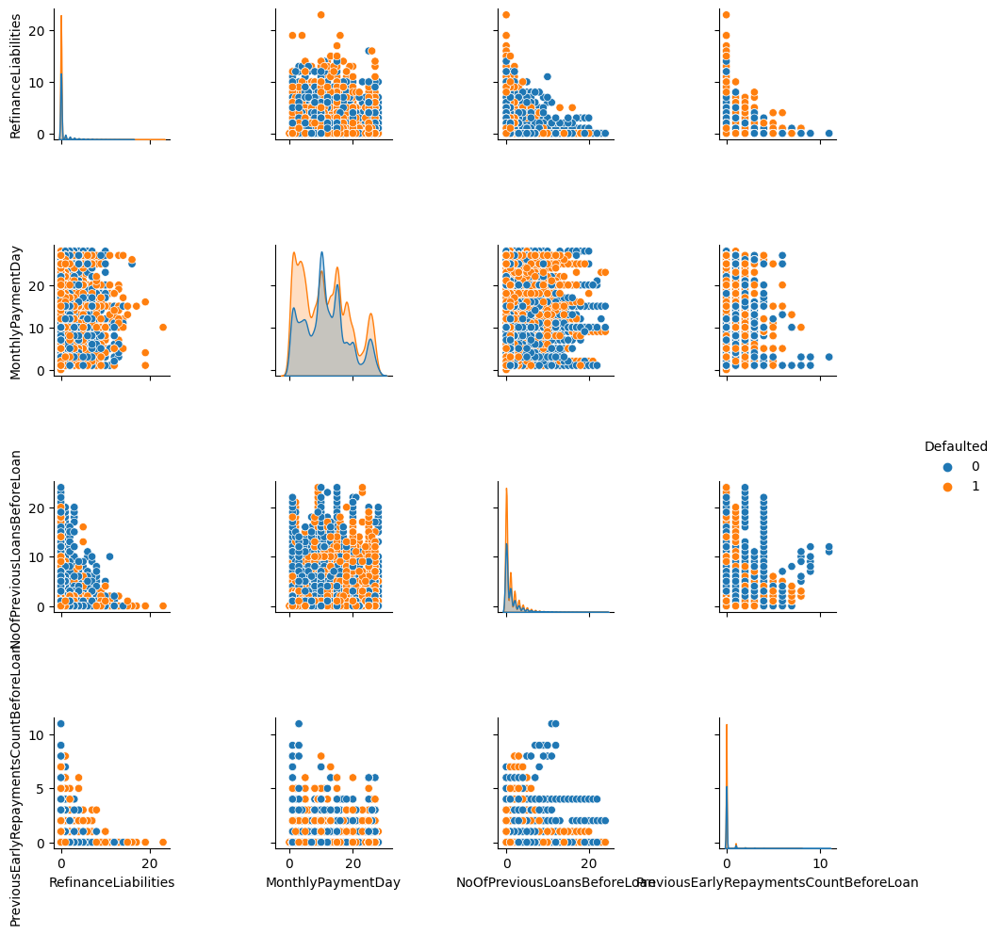

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(df[low_unique_num] , diag_kind="kde" , hue="Defaulted")

<Figure size 2500x1000 with 0 Axes>

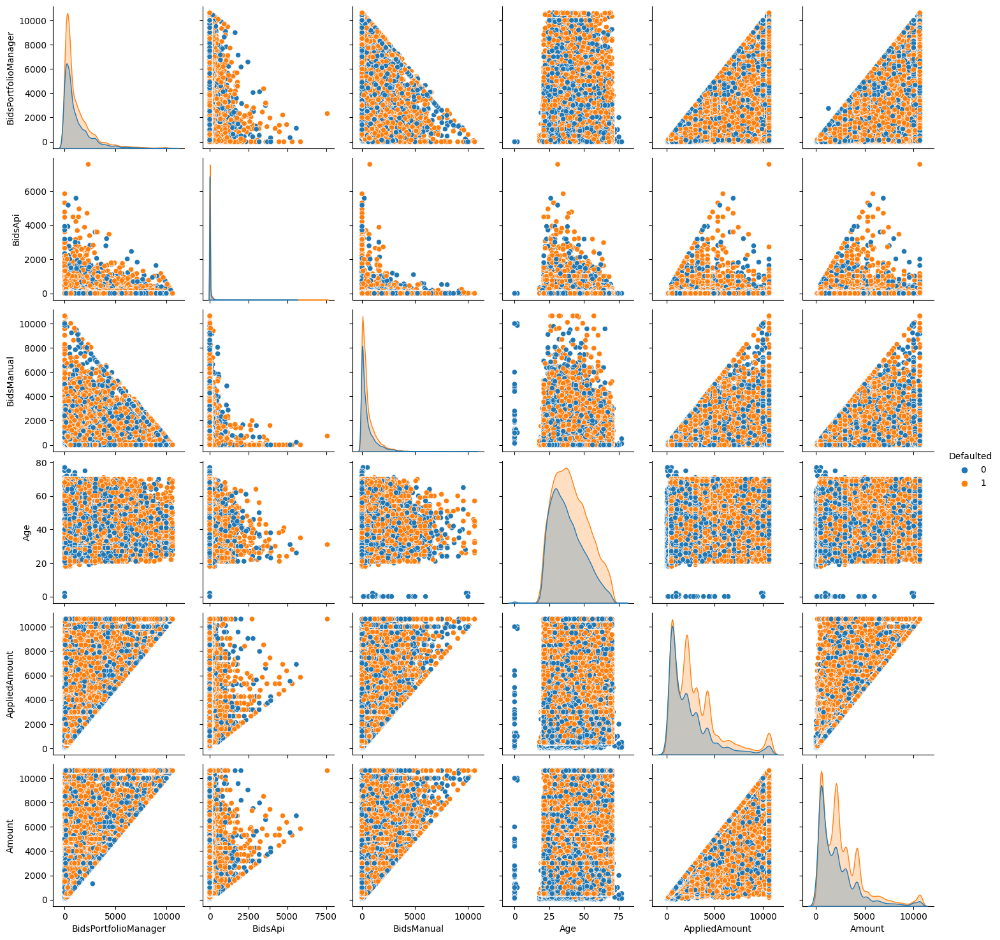

In [ ]:
plt.figure(figsize=(25,10))
high_unique1_ = high_unique1.insert(0,"Defaulted")
sns.pairplot(df[high_unique1_] , diag_kind="kde" , hue="Defaulted")

<Figure size 2500x1000 with 0 Axes>

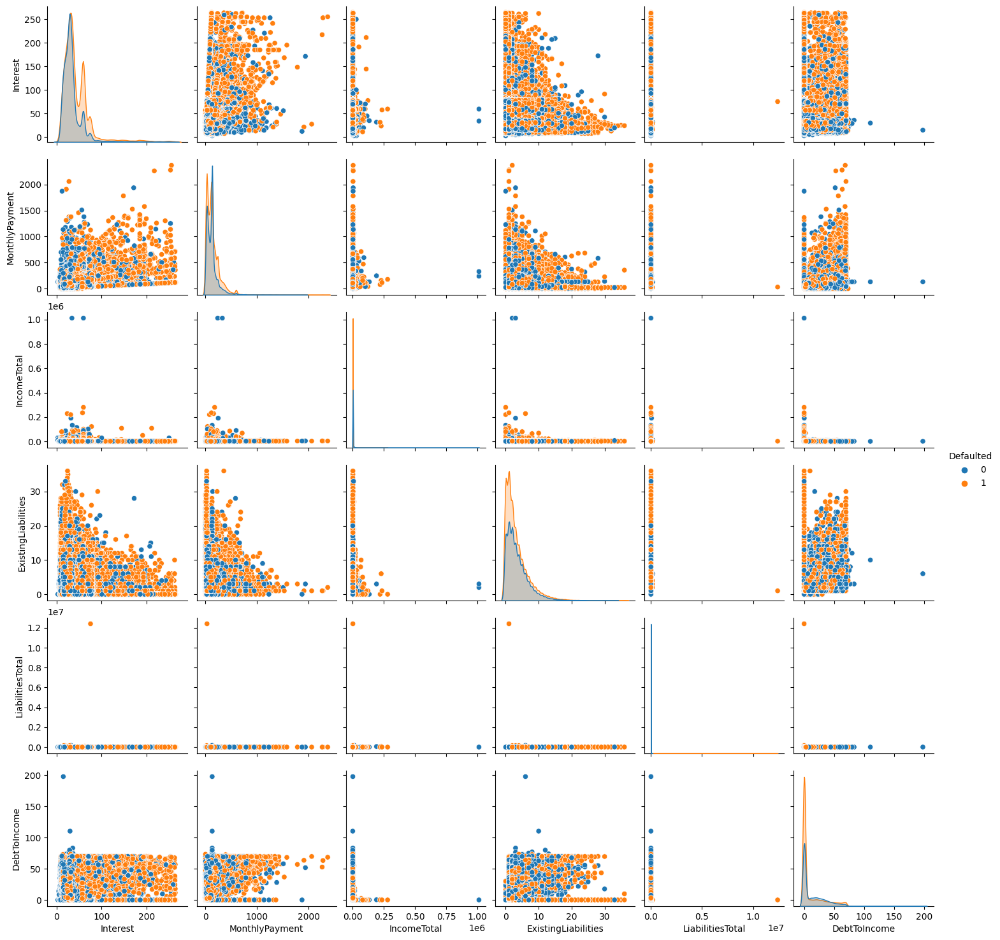

In [ ]:
plt.figure(figsize=(25,10))
high_unique2_ = high_unique2.insert(0,"Defaulted")
sns.pairplot(df[high_unique2_] , diag_kind="kde" , hue="Defaulted")

It Looks about right that our Target Variable doesn't have a linear relationship between other features

<Figure size 2500x1000 with 0 Axes>

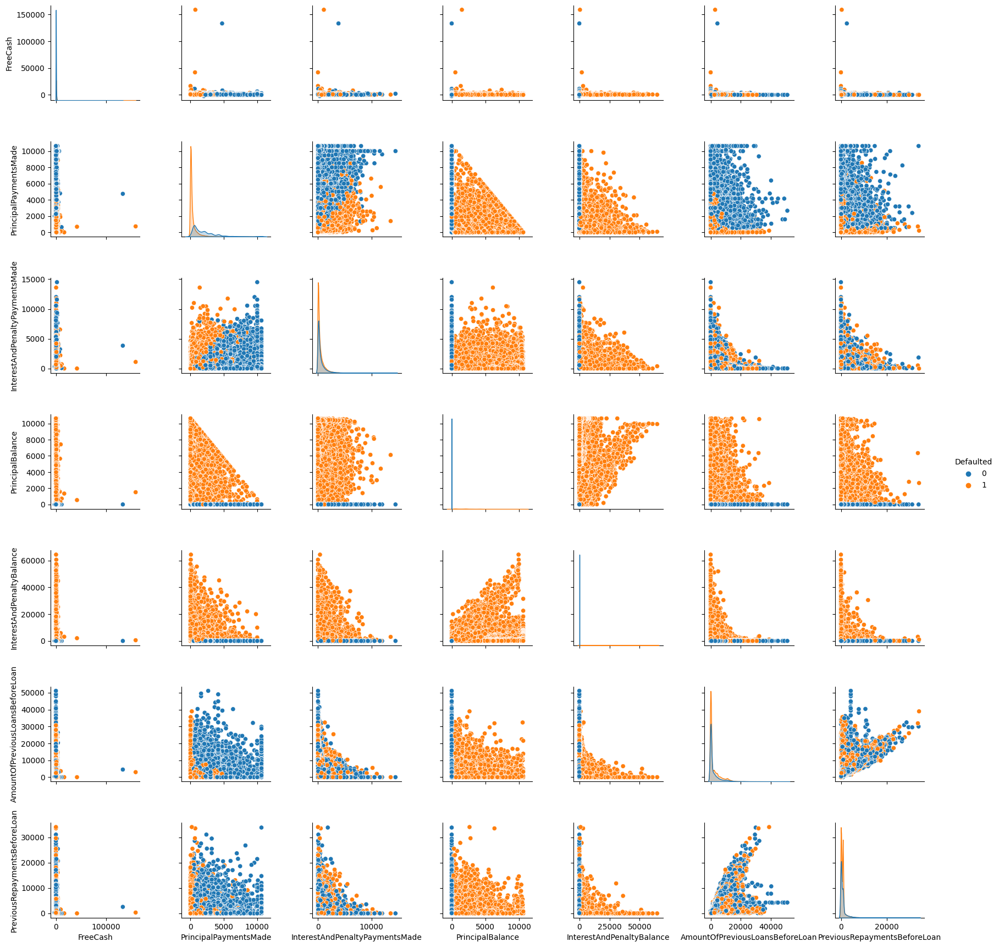

In [ ]:
plt.figure(figsize=(25,10))
high_unique3_ = high_unique3.insert(0,"Defaulted")
sns.pairplot(df[high_unique3_] , diag_kind="kde" , hue="Defaulted")

It Looks about right that our Target Variable have low positive correlation to `PrincipalBalance` and `InterestAndPenaltyBalance` and negatively with `PrincipalPaymentsMade`                   

**Now let's see insights about the target variable with other features**

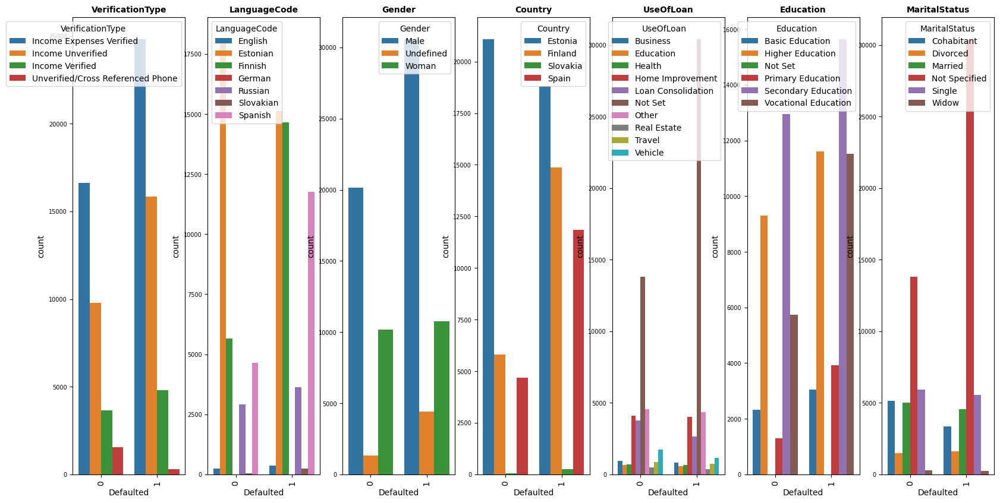

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_cat1].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.countplot(df["Defaulted"] ,hue=df[low_unique_cat1].iloc[:,i], ax=ax )
    ax.set_title(df[low_unique_cat1].columns[i], fontsize=10, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=10 , rotation=90)

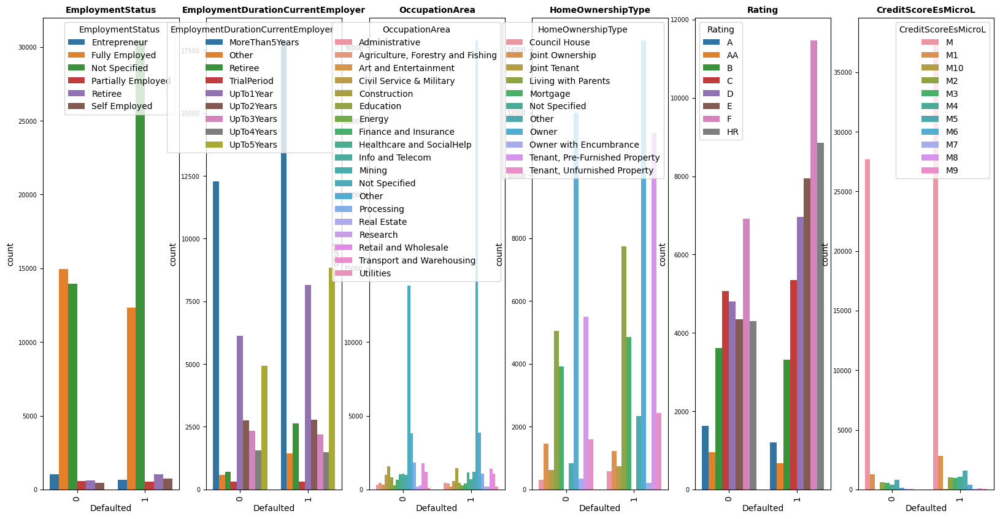

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_cat2].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.countplot(df["Defaulted"] ,hue=df[low_unique_cat2].iloc[:,i], ax=ax )
    ax.set_title(df[low_unique_cat2].columns[i], fontsize=10, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=10 , rotation=90)

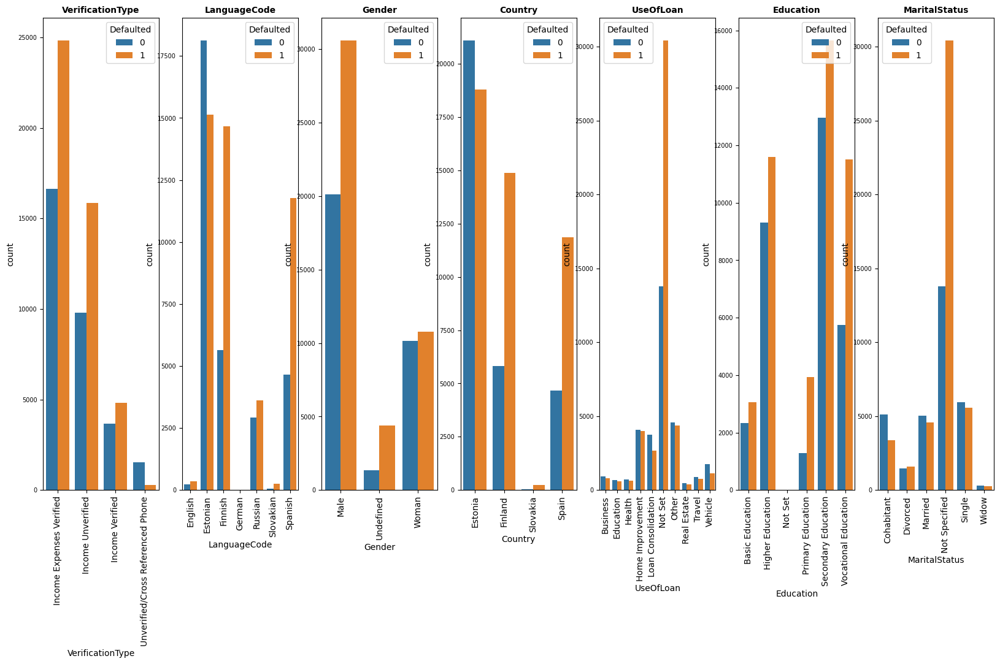

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_cat1].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.countplot(df[low_unique_cat1].iloc[:,i] ,hue=df["Defaulted"], ax=ax )
    ax.set_title(df[low_unique_cat1].columns[i], fontsize=10, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=10 , rotation=90)

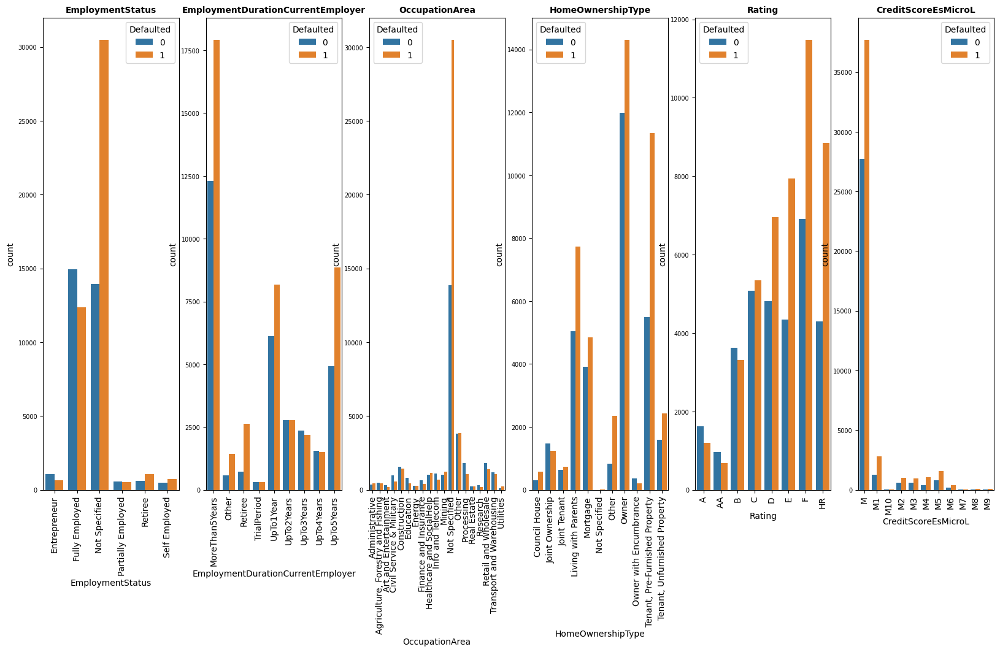

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_cat2].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.countplot(df[low_unique_cat2].iloc[:,i] ,hue=df["Defaulted"], ax=ax )
    ax.set_title(df[low_unique_cat2].columns[i], fontsize=10, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=10 , rotation=90)

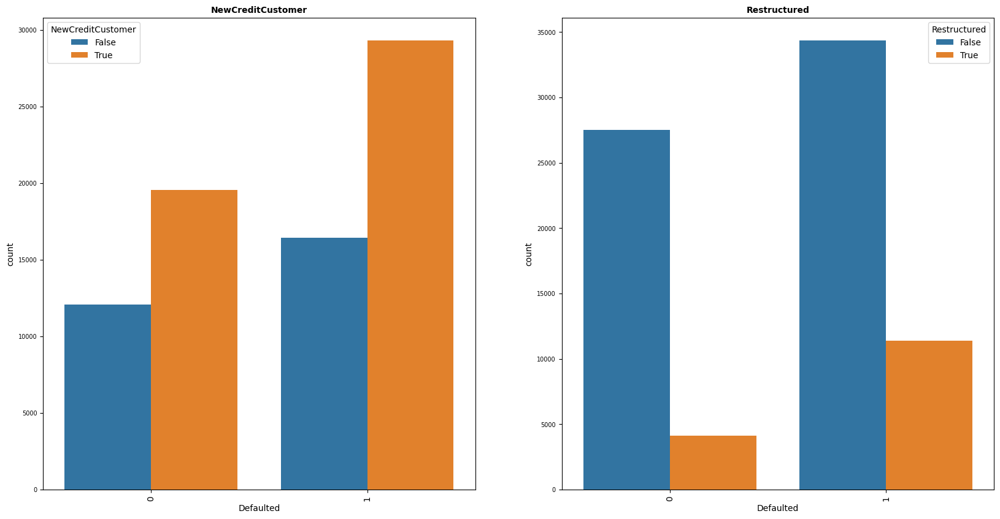

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_bool].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.countplot(df["Defaulted"] ,hue=df[low_unique_bool].iloc[:,i], ax=ax )
    ax.set_title(df[low_unique_bool].columns[i], fontsize=10, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=10 , rotation=90)

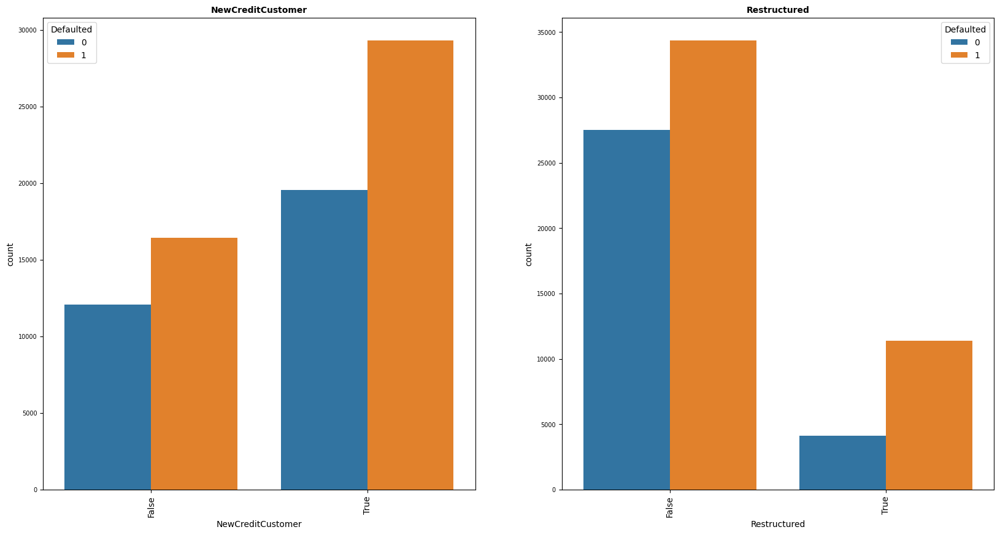

In [ ]:
#Creating subplot of each column with its own scale
fig, axs = plt.subplots(1, len(df[low_unique_bool].columns), figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.countplot(df[low_unique_bool].iloc[:,i], hue=df["Defaulted"], ax=ax )
    ax.set_title(df[low_unique_bool].columns[i], fontsize=10, fontweight='bold')
    ax.tick_params(axis='y', labelsize=7)
    ax.tick_params(axis='x', labelsize=10 , rotation=90)

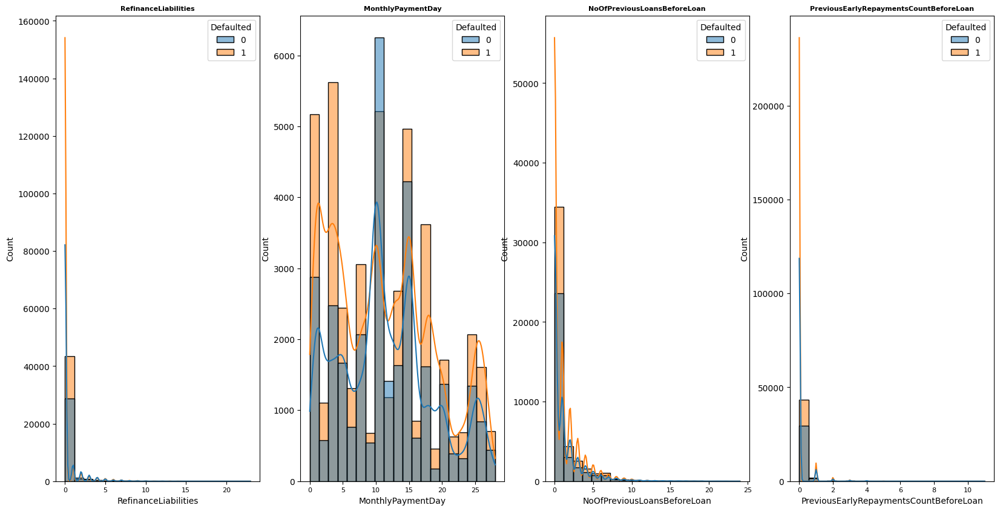

In [ ]:
fig, axs = plt.subplots(1, len(df[low_unique_num].columns)-1, figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.histplot(x=df[low_unique_num].iloc[:,i] , ax=ax , kde=True, hue="Defaulted" , data=df[low_unique_num], bins=20)
    ax.set_title(df[low_unique_num].columns[i], fontsize=8, fontweight='bold')
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=10)

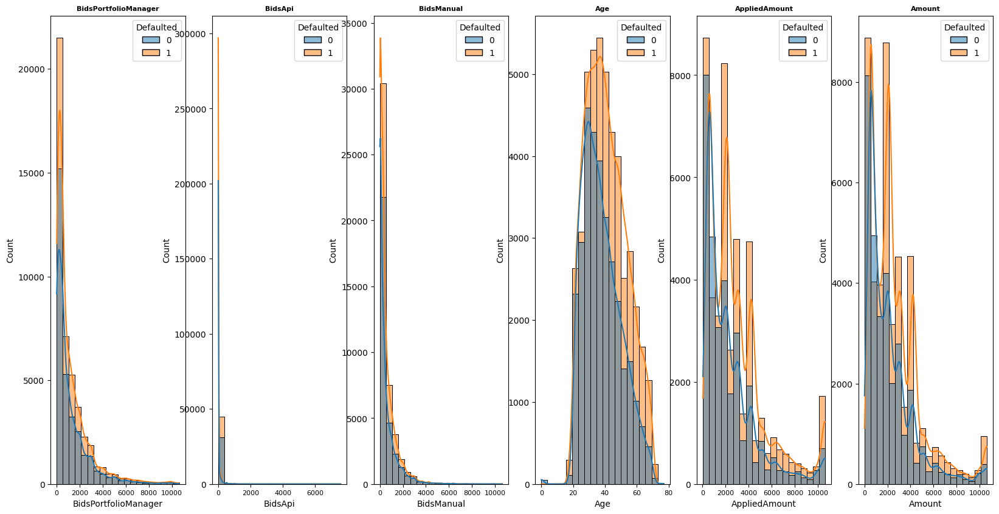

In [ ]:
fig, axs = plt.subplots(1, len(df[high_unique1_].columns)-1, figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.histplot(x=df[high_unique1_].iloc[:,i+1] , ax=ax , kde=True, hue="Defaulted" , data=df[high_unique1_], bins=20)
    ax.set_title(df[high_unique1_].columns[i+1], fontsize=8, fontweight='bold')
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=10)

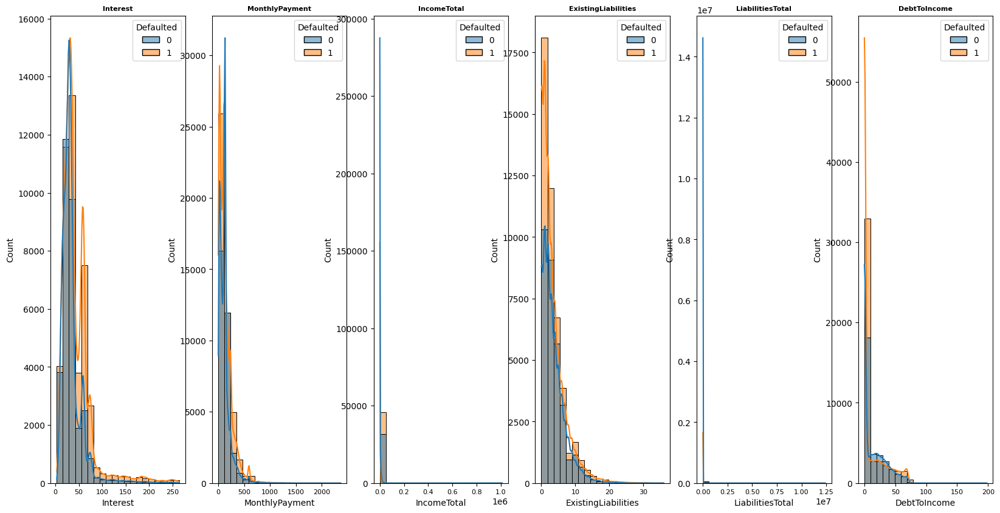

In [ ]:
fig, axs = plt.subplots(1, len(df[high_unique2_].columns)-1, figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.histplot(x=df[high_unique2_].iloc[:,i+1] , ax=ax , kde=True, hue="Defaulted" , data=df[high_unique2_], bins=20)
    ax.set_title(df[high_unique2_].columns[i+1], fontsize=8, fontweight='bold')
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=10)

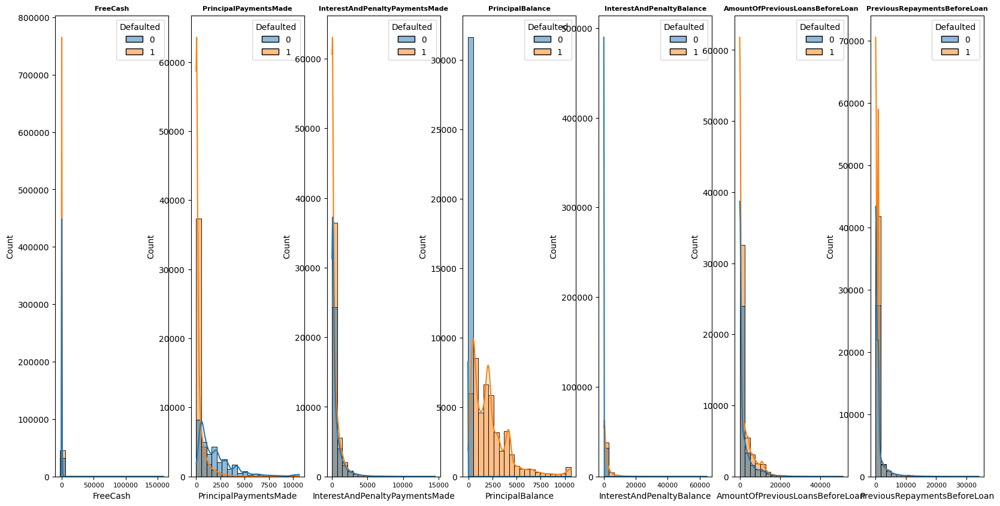

In [ ]:
fig, axs = plt.subplots(1, len(df[high_unique3_].columns)-1, figsize=(20,10))

for i, ax in enumerate(axs.flat):
    sns.histplot(x=df[high_unique3_].iloc[:,i+1] , ax=ax , kde=True, hue="Defaulted" , data=df[high_unique3_], bins=20)
    ax.set_title(df[high_unique3_].columns[i+1], fontsize=8, fontweight='bold')
    ax.tick_params(axis='x', labelsize=8)
    ax.tick_params(axis='y', labelsize=10)

<Figure size 2500x1000 with 0 Axes>

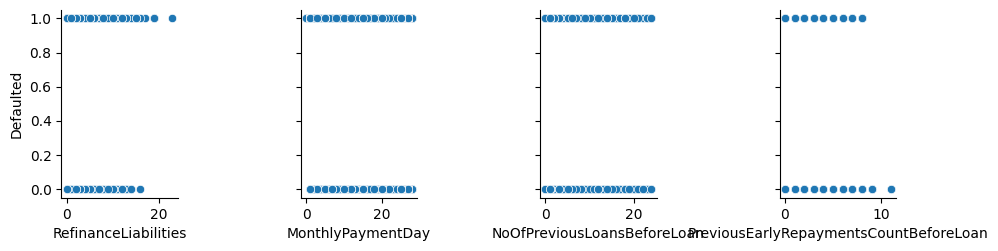

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(x_vars=df[low_unique_num].drop(columns = "Defaulted").columns ,y_vars="Defaulted" , diag_kind="kde", data=df[low_unique_num])

<Figure size 2500x1000 with 0 Axes>

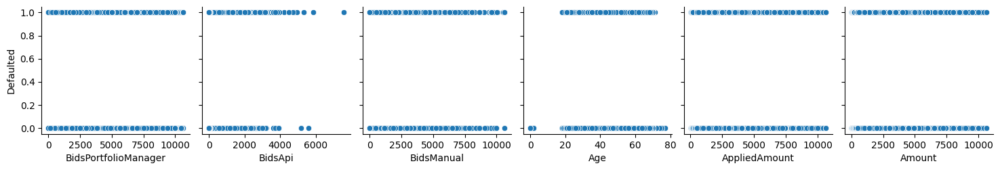

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(x_vars=df[high_unique1_.drop("Defaulted")] ,y_vars="Defaulted" , diag_kind="kde", data=df[high_unique1_])

<Figure size 2500x1000 with 0 Axes>

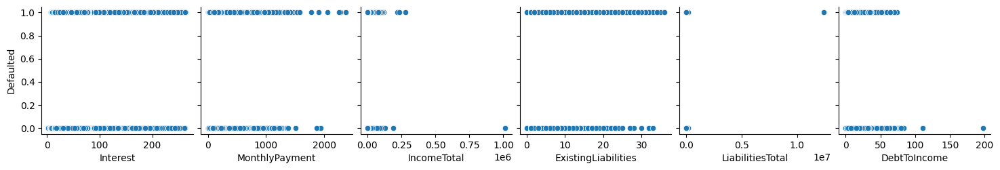

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(x_vars=df[high_unique2_.drop("Defaulted")] ,y_vars="Defaulted" , diag_kind="kde", data=df[high_unique2_])    

<Figure size 2500x1000 with 0 Axes>

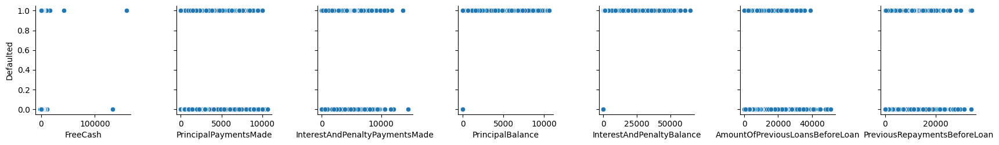

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(x_vars=df[high_unique3_.drop("Defaulted")] ,y_vars="Defaulted" , diag_kind="kde", data=df[high_unique3_])        

# **Now let's see the correlation between features**

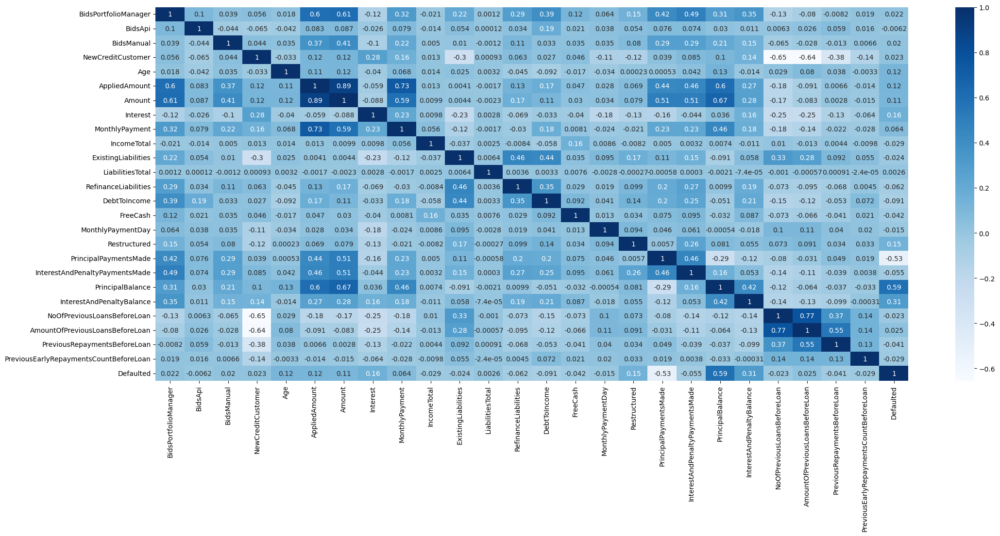

In [ ]:
plt.figure(figsize=(25,10))
sns.heatmap( df.corr(), annot=True, cmap='Blues')

**Bivariate Analysis**

Seperating Bivariate analysis to : High Positive , High Negative , low-no Correlation between Features

> High Positve Correlation

In [ ]:
High_Positive_Corr = df.corr() > 0.5 # high positve correlation
High_Positive_Corr = (High_Positive_Corr==True).sum() > 1 # to find who has correlation with other cloumns 
High_Positive_Corr = High_Positive_Corr[High_Positive_Corr==True].index

High_Positive_Corr

Index(['BidsPortfolioManager', 'AppliedAmount', 'Amount', 'MonthlyPayment',
       'PrincipalPaymentsMade', 'InterestAndPenaltyPaymentsMade',
       'PrincipalBalance', 'NoOfPreviousLoansBeforeLoan',
       'AmountOfPreviousLoansBeforeLoan', 'PreviousRepaymentsBeforeLoan',
       'Defaulted'],
      dtype='object')

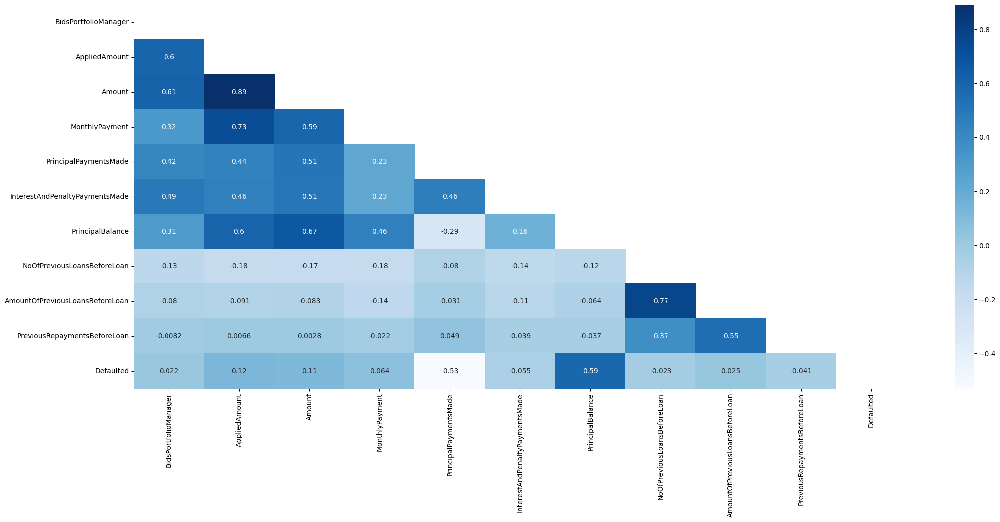

In [ ]:
plt.figure(figsize=(25,10))
mask = np.triu(np.ones_like(df[High_Positive_Corr].corr(), dtype=bool))
sns.heatmap( df[High_Positive_Corr].corr(), annot=True, cmap='Blues', mask=mask)

**Looks like these features are highly positive correlated with each other**

> `AppliedAmount , Amount , MonthlyPayment , PrincipalBalance` 

> `ExistingLiabilities , NoOfPreviousLoansBeforeLoan , AmountOfPreviousLoansBeforeLoan`

> `PrincipalPaymentsMade , BidsPortfolioManager , InterestAndPenaltyPaymentsMade`

Let's draw a scatter plot to verify this assumptios

In [ ]:
Pos_Corr_Features1 = df[["AppliedAmount" , "Amount" , "MonthlyPayment" , "PrincipalBalance"]]
print(Pos_Corr_Features1.info())
print("--------------------------------------------")
Pos_Corr_Features2 = df[["ExistingLiabilities" , "NoOfPreviousLoansBeforeLoan" , "AmountOfPreviousLoansBeforeLoan"]]
print(Pos_Corr_Features2.info())
print("--------------------------------------------")
Pos_Corr_Features3 = df[["PrincipalPaymentsMade" , "BidsPortfolioManager" , "InterestAndPenaltyPaymentsMade"]]
print(Pos_Corr_Features3.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   AppliedAmount     77394 non-null  float64
 1   Amount            77394 non-null  float64
 2   MonthlyPayment    77394 non-null  float64
 3   PrincipalBalance  77394 non-null  float64
dtypes: float64(4)
memory usage: 2.4 MB
None
--------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 3 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   ExistingLiabilities              77394 non-null  int64  
 1   NoOfPreviousLoansBeforeLoan      77394 non-null  int64  
 2   AmountOfPreviousLoansBeforeLoan  77394 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 1.8 MB
None
--------------------------------------------
<c

<Figure size 2500x1000 with 0 Axes>

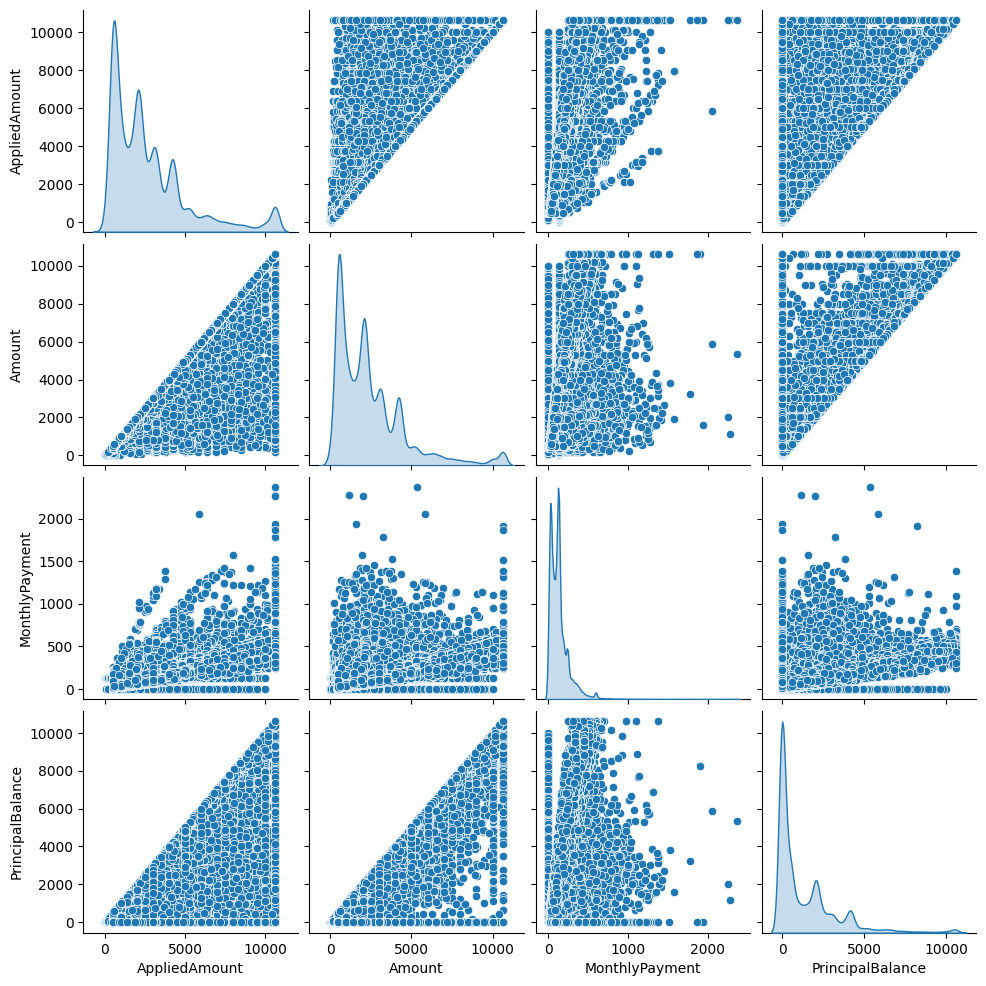

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(Pos_Corr_Features1 , diag_kind="kde")

<Figure size 3000x3000 with 0 Axes>

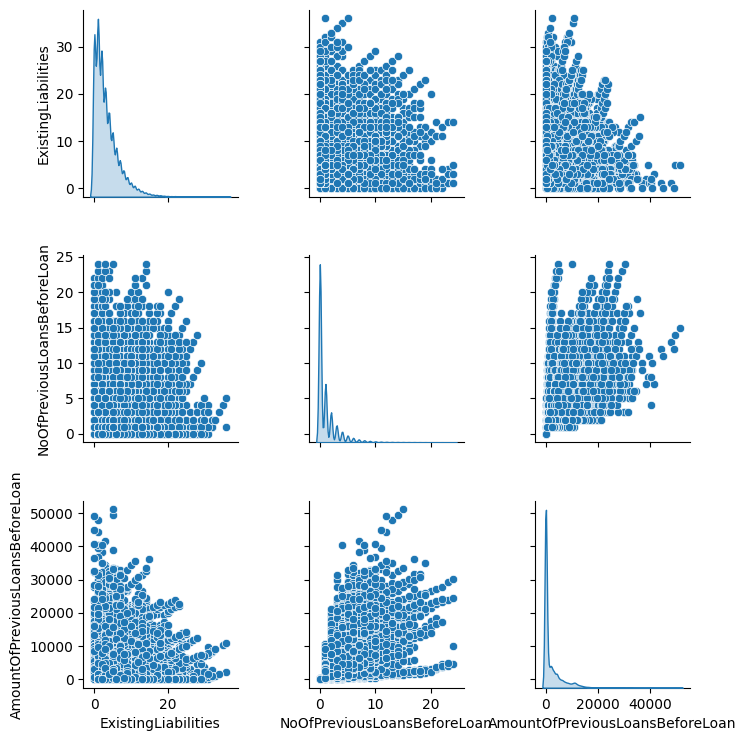

In [ ]:
plt.figure(figsize=(30,30))

sns.pairplot(Pos_Corr_Features2 , diag_kind="kde")

<Figure size 2500x1000 with 0 Axes>

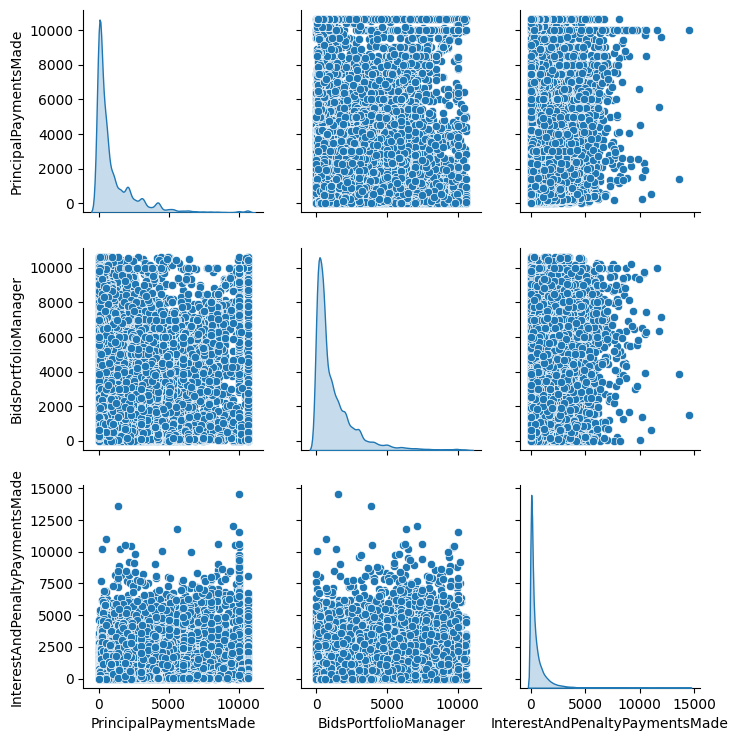

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(Pos_Corr_Features3 , diag_kind="kde")

It looks there is actually a postive relationshp between those features



---



High Negative Correlation

In [ ]:
High_Negative_Corr = df.corr() < 0 # high negative correlation

High_Negative_Corr

High_Negative_Corr = (High_Negative_Corr==True).sum() >= 10 # to filter columns with high negative correlation
High_Negative_Corr = High_Negative_Corr[High_Negative_Corr==True].index 

High_Negative_Corr

Index(['Interest', 'IncomeTotal', 'LiabilitiesTotal', 'PrincipalBalance',
       'NoOfPreviousLoansBeforeLoan', 'AmountOfPreviousLoansBeforeLoan',
       'PreviousRepaymentsBeforeLoan',
       'PreviousEarlyRepaymentsCountBeforeLoan', 'Defaulted'],
      dtype='object')

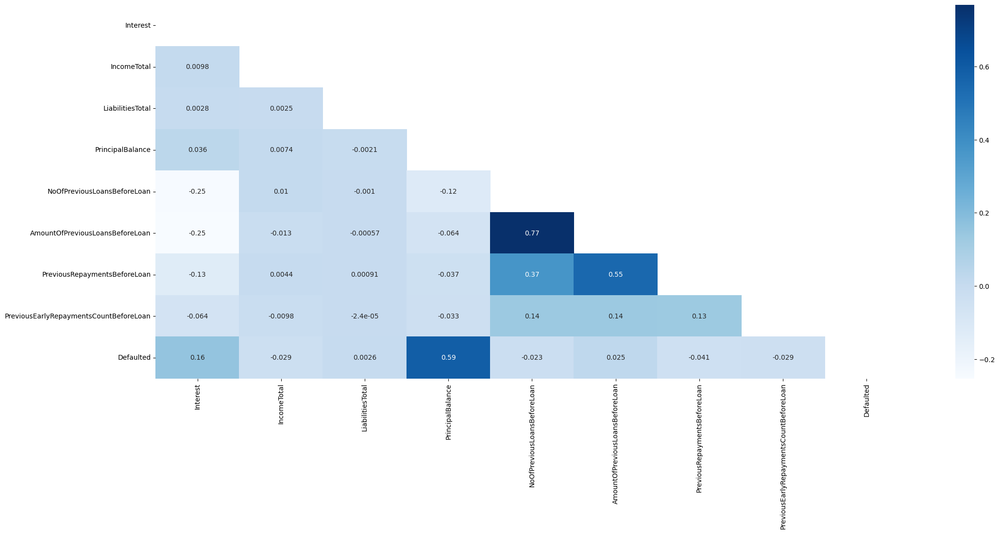

In [ ]:
plt.figure(figsize=(25,10))
mask = np.triu(np.ones_like(df[High_Negative_Corr].corr(), dtype=bool))
sns.heatmap( df[High_Negative_Corr].corr(), annot=True, cmap='Blues', mask=mask)

**Looks like NewCreditCustomer Columns are high negatively corralted with these features**

> `NewCreditCustomer` ----> `AmountOfPreviousLoansBeforeLoan, ExistingLiabilities, NoOfPreviousLoansBeforeLoan`

Let's draw a scatter plot to verify this assumptios

In [ ]:
# NewCreditCustomer --> bool
Negative_Corr_Features= df[[ "NewCreditCustomer","AmountOfPreviousLoansBeforeLoan", "ExistingLiabilities", "PrincipalBalance"]]

In [ ]:
Negative_Corr_Features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77394 entries, 0 to 77393
Data columns (total 4 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   NewCreditCustomer                77394 non-null  bool   
 1   AmountOfPreviousLoansBeforeLoan  77394 non-null  float64
 2   ExistingLiabilities              77394 non-null  int64  
 3   PrincipalBalance                 77394 non-null  float64
dtypes: bool(1), float64(2), int64(1)
memory usage: 1.8 MB


<Figure size 2500x1000 with 0 Axes>

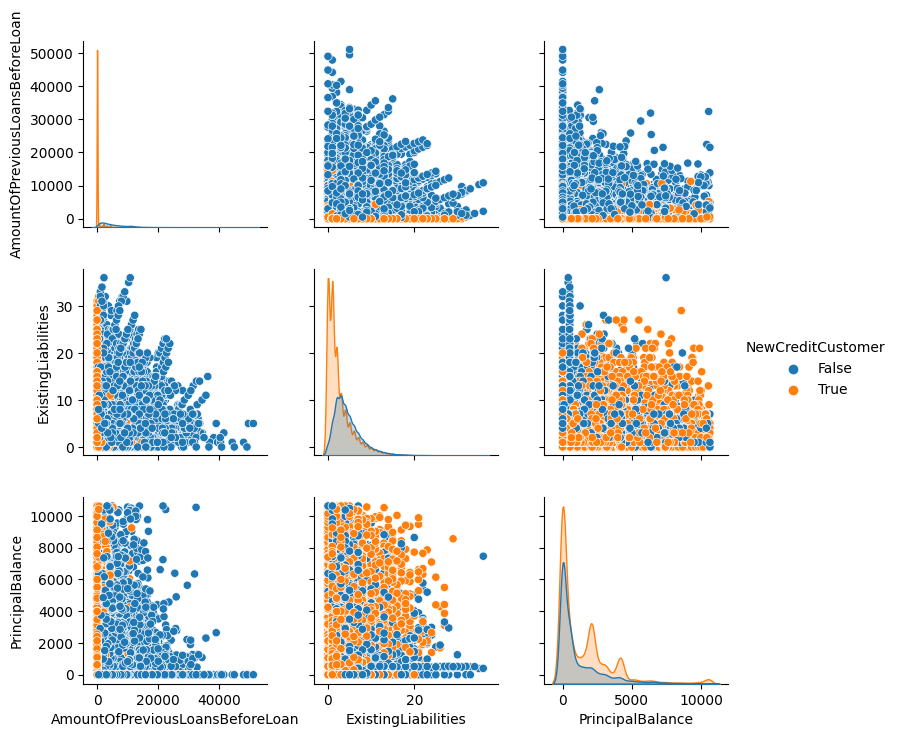

In [ ]:
plt.figure(figsize=(25,10))

sns.pairplot(Negative_Corr_Features, diag_kind="kde" , hue="NewCreditCustomer")

It looks there is actually a negative relationshp between NewCreditCustomer Columns and those features



---



**Low Corrlated Features (No Correlation)**

In [ ]:
low_corr_features = df.drop( columns=Pos_Corr_Features1.columns)
low_corr_features = low_corr_features.drop( columns=Pos_Corr_Features2.columns)
low_corr_features = low_corr_features.drop( columns=Pos_Corr_Features3.columns)
low_corr_features = low_corr_features.drop( columns="NewCreditCustomer")

low_corr_features.dtypes

BidsApi                                      int64
BidsManual                                 float64
VerificationType                          category
LanguageCode                              category
Age                                          int64
Gender                                    category
Country                                   category
Interest                                   float64
LoanDuration                              category
UseOfLoan                                 category
Education                                 category
MaritalStatus                             category
EmploymentStatus                          category
EmploymentDurationCurrentEmployer         category
OccupationArea                            category
HomeOwnershipType                         category
IncomeTotal                                float64
LiabilitiesTotal                           float64
RefinanceLiabilities                         int64
DebtToIncome                   

In [ ]:
low_corr_features.dtypes

BidsApi                                      int64
BidsManual                                 float64
VerificationType                          category
LanguageCode                              category
Age                                          int64
Gender                                    category
Country                                   category
Interest                                   float64
LoanDuration                              category
UseOfLoan                                 category
Education                                 category
MaritalStatus                             category
EmploymentStatus                          category
EmploymentDurationCurrentEmployer         category
OccupationArea                            category
HomeOwnershipType                         category
IncomeTotal                                float64
LiabilitiesTotal                           float64
RefinanceLiabilities                         int64
DebtToIncome                   

In [ ]:
low_corr_features.iloc[: , :10].dtypes

BidsApi                int64
BidsManual           float64
VerificationType    category
LanguageCode        category
Age                    int64
Gender              category
Country             category
Interest             float64
LoanDuration        category
UseOfLoan           category
dtype: object

<Figure size 2500x1000 with 0 Axes>

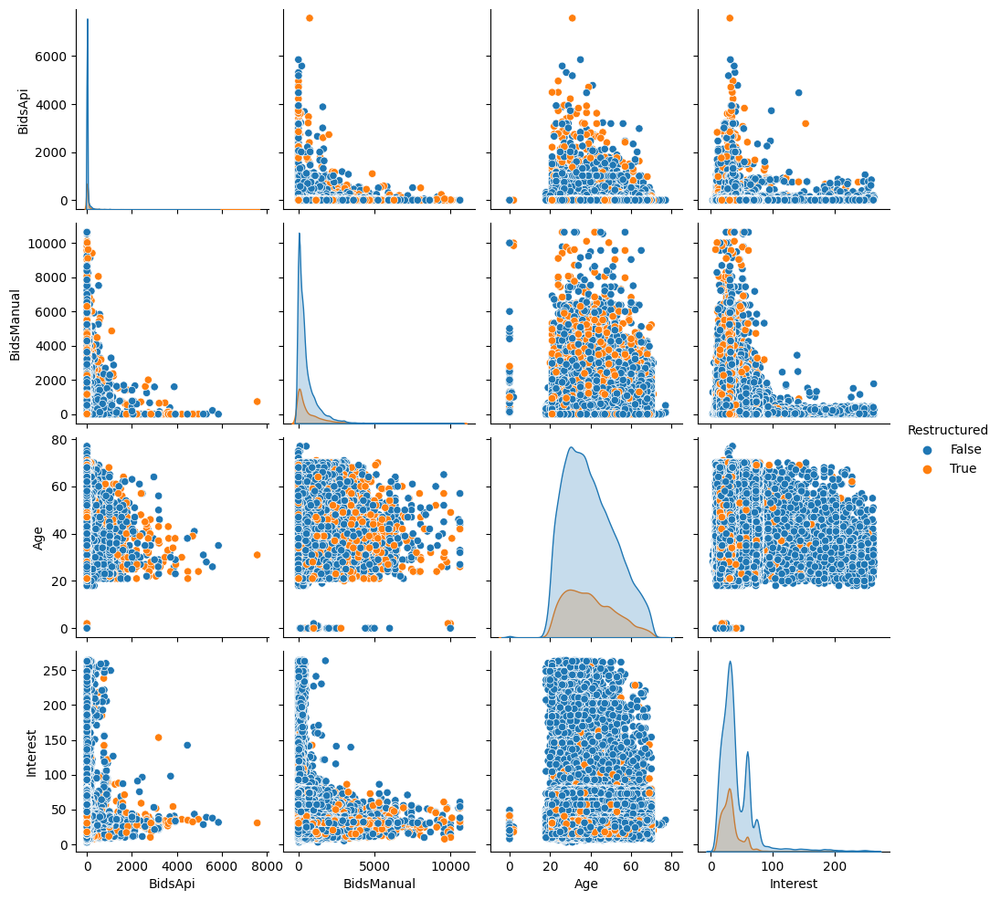

In [ ]:
plt.figure(figsize=(25,10))

low_corr_features1 = low_corr_features.iloc[: , :10]
low_corr_features1["Restructured"] = low_corr_features["Restructured"]

sns.pairplot(low_corr_features1 , diag_kind="kde" ,hue="Restructured" )

In [ ]:
low_corr_features.iloc[: , 10:20].dtypes

Education                            category
MaritalStatus                        category
EmploymentStatus                     category
EmploymentDurationCurrentEmployer    category
OccupationArea                       category
HomeOwnershipType                    category
IncomeTotal                           float64
LiabilitiesTotal                      float64
RefinanceLiabilities                    int64
DebtToIncome                          float64
dtype: object

<Figure size 2500x1000 with 0 Axes>

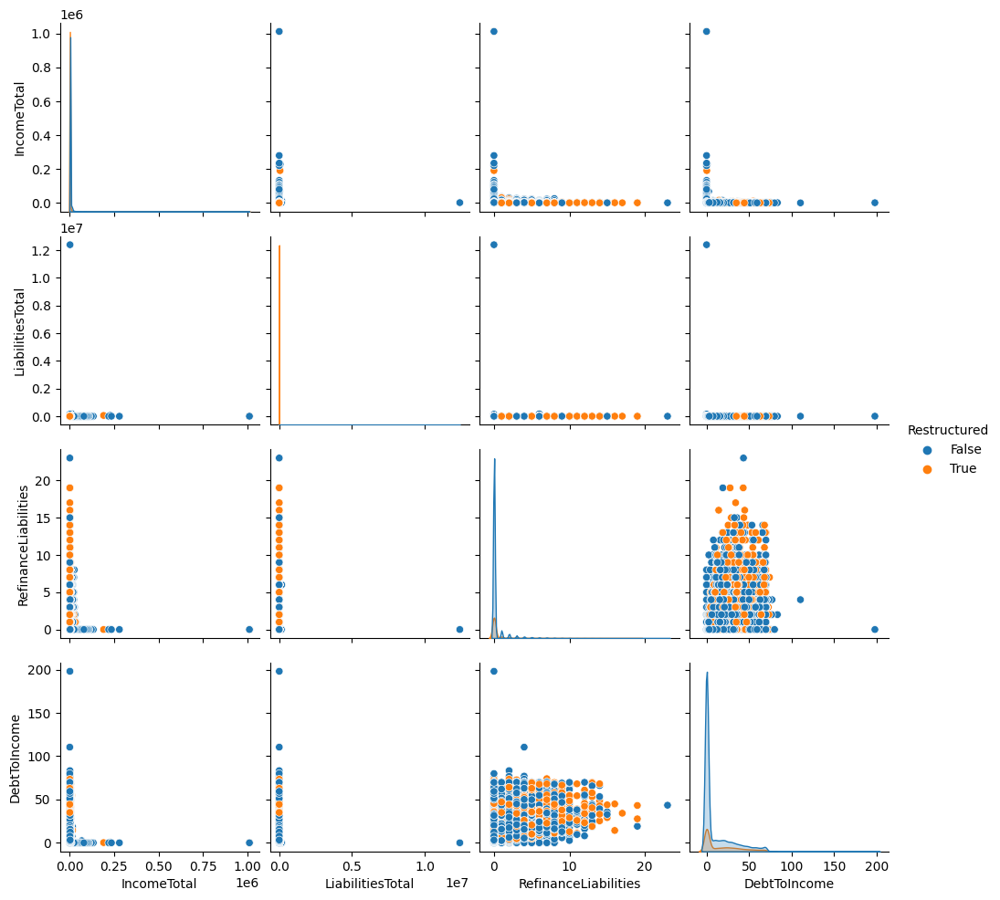

In [ ]:
plt.figure(figsize=(25,10))

low_corr_features2 = low_corr_features.iloc[: , 10:20]
low_corr_features2["Restructured"] = low_corr_features["Restructured"]

sns.pairplot(low_corr_features2 , diag_kind="kde" , hue="Restructured")

In [ ]:
low_corr_features.iloc[: , 20:].dtypes

FreeCash                                   float64
MonthlyPaymentDay                            int64
Rating                                    category
Restructured                                  bool
CreditScoreEsMicroL                       category
InterestAndPenaltyBalance                  float64
PreviousRepaymentsBeforeLoan               float64
PreviousEarlyRepaymentsCountBeforeLoan       int64
Defaulted                                    int64
dtype: object

<Figure size 2500x1000 with 0 Axes>

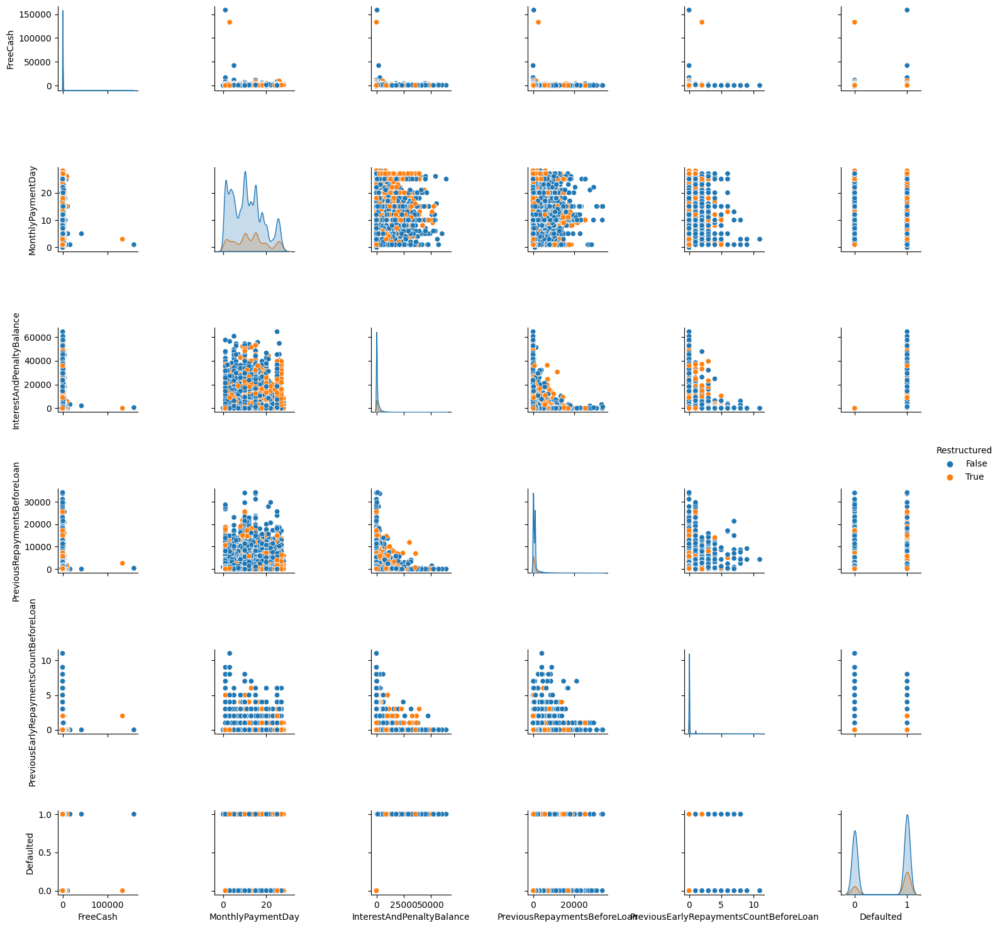

In [ ]:
plt.figure(figsize=(25,10))

low_corr_features3 = low_corr_features.iloc[: , 20:]
low_corr_features3["Restructured"] = low_corr_features["Restructured"]

sns.pairplot(low_corr_features3 , diag_kind="kde" , hue="Restructured")

It looks like there is no actuall relationshp between those features



---

